# Home Credit Default Risk (HCDR)

The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/). The goal of this project is to predict whether or not a client will repay a loan. In order to make sure that people who struggle to get loans due to insufficient or non-existent credit histories have a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.


## Some of the challenges

1. Dataset size 
   * (688 meg uncompressed) with millions of rows of data
   * 2.71 Gig of data uncompressed
* Dealing with missing data
* Imbalanced datasets
* Summarizing transaction data


# Kaggle API setup
Kaggle is a Data Science Competition Platform which shares a lot of datasets. In the past, it was troublesome to submit your result as your have to go through the console in your browser and drag your files there. Now you can interact with Kaggle via the command line. E.g., 

```bash
! kaggle competitions files home-credit-default-risk
```

It is quite easy to setup, it takes me less than 15 minutes to finish a submission.

1. Install library
* Create a API Token (edit your profile on [Kaggle.com](https://www.kaggle.com/)); this produces `kaggle.json` file
* Put your JSON `kaggle.json` in the right place
* Access competition files; make submissions via the command (see examples below)
* Submit result

For more detailed information on setting the Kaggle API see [here](https://medium.com/@nokkk/make-your-kaggle-submissions-with-kaggle-official-api-f49093c04f8a) and [here](https://github.com/Kaggle/kaggle-api).



In [145]:
# !pip install kaggle

In [146]:
!pwd


/root/shared/workspace/AML/Final AML Exam/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/HCDR_Phase_1_baseline_submission


In [147]:
!mkdir ~/.kaggle
!cp /root/shared/Downloads/kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json

/bin/mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [5]:
! kaggle competitions files home-credit-default-risk

404 - Not Found


# Dataset and how to download


## Back ground Home Credit Group

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

### Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.


## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview
There are 7 different sources of data:

* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [148]:
# ![alt](home_credit.png "Home credit")

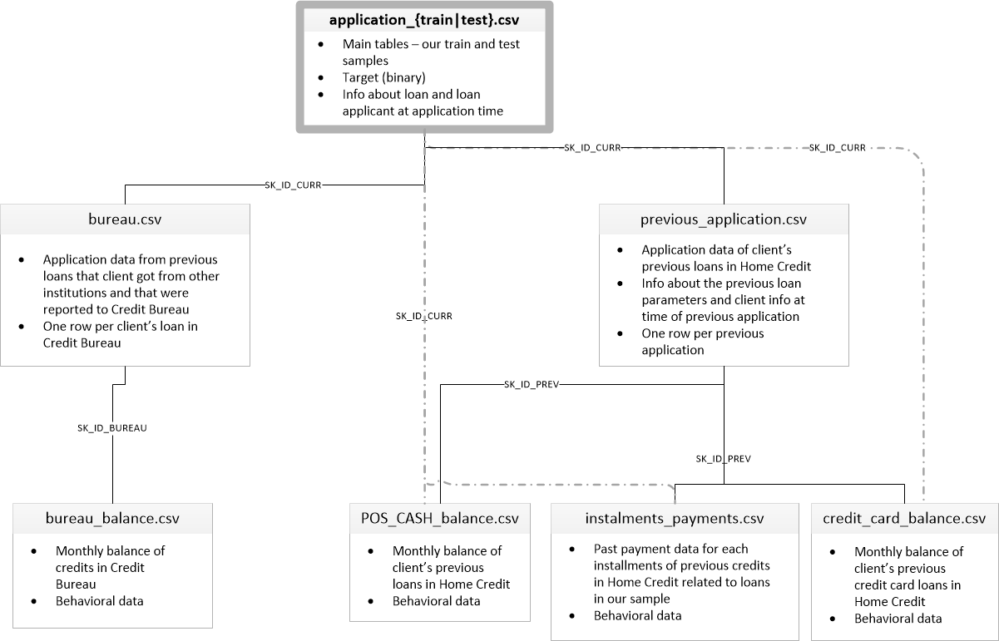

## Downloading the files via Kaggle API

Create a base directory:

```bash
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
```

Please download the project data files and data dictionary and unzip them using either of the following approaches:

1. Click on the `Download` button on the following [Data Webpage](https://www.kaggle.com/c/home-credit-default-risk/data) and unzip the  zip file to the `BASE_DIR`
2. If you plan to use the Kaggle API, please use the following steps.


In [149]:
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
#DATA_DIR = os.path.join('./ddddd/')
!mkdir $DATA_DIR

/bin/mkdir: cannot create directory ‘../../../Data/home-credit-default-risk’: File exists


In [150]:
!ls -l $DATA_DIR

total 2621364
-rw-r--r-- 1 root root     37383 Nov 15 21:16 HomeCredit_columns_description.csv
-rw-r--r-- 1 root root 392703158 Nov 15 21:21 POS_CASH_balance.csv
-rw-r--r-- 1 root root  26567651 Nov 15 21:16 application_test.csv
-rw-r--r-- 1 root root 166133370 Nov 15 21:18 application_train.csv
-rw-r--r-- 1 root root 170016717 Nov 15 21:19 bureau.csv
-rw-r--r-- 1 root root 375592889 Nov 15 21:21 bureau_balance.csv
-rw-r--r-- 1 root root 424582605 Nov 15 21:21 credit_card_balance.csv
-rw-r--r-- 1 root root 723118349 Nov 15 21:22 installments_payments.csv
-rw-r--r-- 1 root root 404973293 Nov 15 21:21 previous_application.csv
-rw-r--r-- 1 root root    536202 Nov 15 21:16 sample_submission.csv


In [151]:
# ! kaggle competitions download home-credit-default-risk -p $DATA_DIR

### Imports

In [152]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [153]:
%matplotlib inline

In [154]:
unzippingReq = False
if unzippingReq: #please modify this code 
    zip_ref = zipfile.ZipFile('application_train.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('application_test.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('bureau_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('bureau.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('credit_card_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('installments_payments.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('POS_CASH_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('previous_application.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()

## Data files overview
### Data Dictionary

As part of the data download comes a  Data Dictionary. It named `HomeCredit_columns_description.csv`

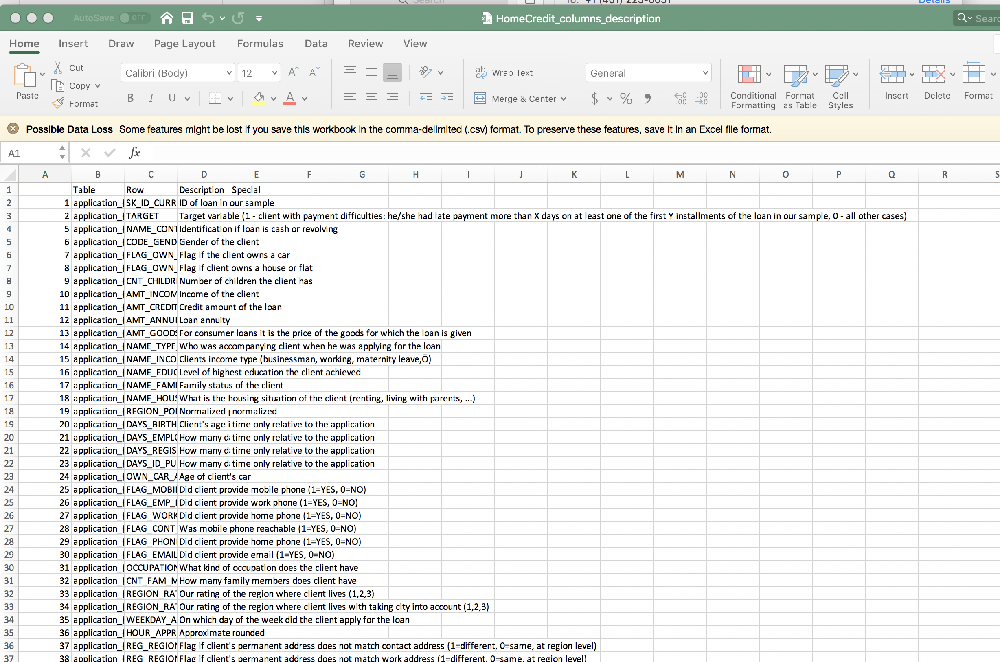

### Application train

In [155]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

def load_data(in_path, name):
    df = pd.read_csv(in_path)
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    return df

datasets={}  # lets store the datasets in a dictionary so we can keep track of them easily
ds_name = 'application_train'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

datasets['application_train'].shape

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


(307511, 122)

### Application test


* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.


In [156]:
ds_name = 'application_test'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


The application dataset has the most information about the client: Gender, income, family status, education ...

### The Other datasets

* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [157]:
%%time
ds_names = ("application_train", "application_test", "bureau","bureau_balance","credit_card_balance","installments_payments",
            "previous_application","POS_CASH_balance")

for ds_name in ds_names:
    datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


bureau: shape is (1716428, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


bureau_balance: shape is (27299925, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB
None


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


credit_card_balance: shape is (3840312, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_C

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


installments_payments: shape is (13605401, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


previous_application: shape is (1670214, 37)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 1

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


POS_CASH_balance: shape is (10001358, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


CPU times: user 3min 9s, sys: 19.6 s, total: 3min 29s
Wall time: 4min 53s


In [158]:
for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')


dataset application_train       : [    307,511, 122]
dataset application_test        : [     48,744, 121]
dataset bureau                  : [  1,716,428, 17]
dataset bureau_balance          : [ 27,299,925, 3]
dataset credit_card_balance     : [  3,840,312, 23]
dataset installments_payments   : [ 13,605,401, 8]
dataset previous_application    : [  1,670,214, 37]
dataset POS_CASH_balance        : [ 10,001,358, 8]


<h1 style = "font-family: Times New Roman;background-color:#CbC3E3	">Exploratory Data Analysis</h1>

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Summary of Application train</h2>

In [159]:
datasets["application_train"].info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

In [160]:
datasets["application_train"].shape

(307511, 122)

In [161]:
datasets["application_train"].describe() #numerical only features

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [162]:
datasets["application_test"].describe() #numerical only features

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [163]:
datasets["application_test"].shape

(48744, 121)

In [164]:
datasets["application_train"].describe(include='all') #look at all categorical and numerical

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511,307511,307511,307511,307511.000000,3.075110e+05,3.075110e+05,307499.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,278232,202448,202924,213312,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,278180.518577,0.080729,NaN,NaN,NaN,NaN,0.417052,1.687979e+05,5.990260e+05,27108.573909,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,NaN,NaN,NaN,NaN,0.722121,2.371231e+05,4.024908e+05,14493.737315,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,2.565000e+04,4.500000e+04,1615.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.125000e+05,2.700000e+05,16524.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.471500e+05,5.135310e+05,24903.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,NaN,NaN,NaN,NaN,1.000000,2.025000e+05,8.086500e+05,34596.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Data Description </h2>

* In this dataset we have a total of 122 columns.
* There are a lot of columns which have missing values in the dataset.
* As we can already see that there are so many missing values in the top 10 rows itself.
* We'll have to figure out a way to deal with thid!


In [165]:
datasets['application_train'].corrwith(datasets['application_train']["TARGET"]).sort_values(ascending = False)

TARGET                         1.000000
DAYS_BIRTH                     0.078239
REGION_RATING_CLIENT_W_CITY    0.060893
REGION_RATING_CLIENT           0.058899
DAYS_LAST_PHONE_CHANGE         0.055218
                                 ...   
FLOORSMAX_AVG                 -0.044003
DAYS_EMPLOYED                 -0.044932
EXT_SOURCE_1                  -0.155317
EXT_SOURCE_2                  -0.160472
EXT_SOURCE_3                  -0.178919
Length: 106, dtype: float64

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Correlation with the Target Variable </h2>

As we an see above, here we have tried to find out the correlation of various indepenndent features in the dataset with the dependent variable or the target variable and tried understanding the feature correlation.
We see that there are very few columns which are related to the target variable, thus making it all the. ore difficult to draw our predictions. Let's see how we proceed with it further! 

In [166]:
percent = (datasets["application_train"].isnull().sum()/datasets["application_train"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_train"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
missing_application_train_data.head(20)

,Percent,Train Missing Count
COMMONAREA_MEDI,69.87,214865
COMMONAREA_AVG,69.87,214865
COMMONAREA_MODE,69.87,214865
NONLIVINGAPARTMENTS_MODE,69.43,213514
NONLIVINGAPARTMENTS_AVG,69.43,213514
NONLIVINGAPARTMENTS_MEDI,69.43,213514
FONDKAPREMONT_MODE,68.39,210295
LIVINGAPARTMENTS_MODE,68.35,210199
LIVINGAPARTMENTS_AVG,68.35,210199
LIVINGAPARTMENTS_MEDI,68.35,210199


In [167]:
datasets['application_train'].isnull().sum()

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Missing Values Analysis </h2>

* There are so many columns in the dataset whoch have large amount of missing values and we need to deal with those in some way. We'll figure it out in the path ahead.

**Missingno** is a Python library that provides the ability to understand the distribution of missing values through informative visualizations. The visualizations can be in the form of heat maps or bar charts. With this library, it is possible to observe where the missing values have occurred and to check the correlation of the columns containing the missing with the target column. 

In [168]:
df = datasets['application_train'].copy()

In [169]:
import missingno as msno
# msno.matrix(df)

<AxesSubplot:>

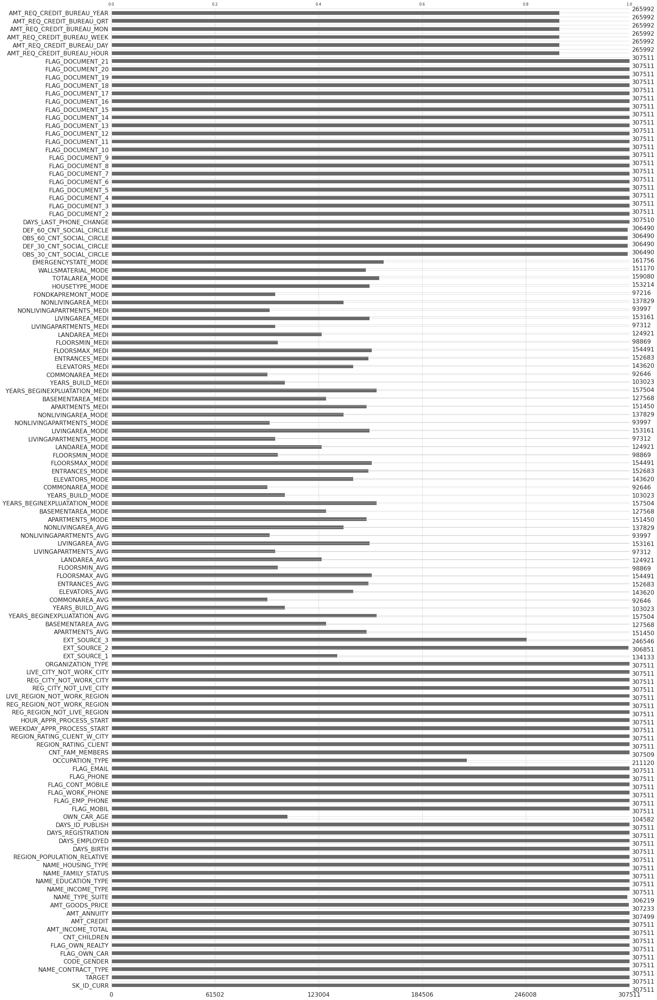

In [170]:
msno.bar(datasets['application_train'])

> The above graph showing the number of missing values with respect to the columns.

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Visualization Through Correlation Matrix </h3>

> A **Correlation Matrix** is used to examine the relationship between multiple variables at the same time. When we do this calculation we get a table containing the correlation coefficients between each variable and the others. Now, the coefficient show us both the strength of the relationship and its direction (positive or negative correlations). In Python, a correlation matrix can be created using the Python packages Pandas and NumPy, for instance.


* If we have a big data set, and we have an intention to explore patterns.
* For use in other statistical methods. For instance, correlation matrices can be used as data when conducting exploratory factor analysis, confirmatory factor analysis, structural equation models.
* Correlation matrices can also be used as a diagnostic when checking assumptions for e.g. regression analysis.

In [171]:
appp_50 = datasets['application_train'][datasets['application_train'].columns[datasets['application_train'].isnull().sum()>0.5]]

<AxesSubplot:>

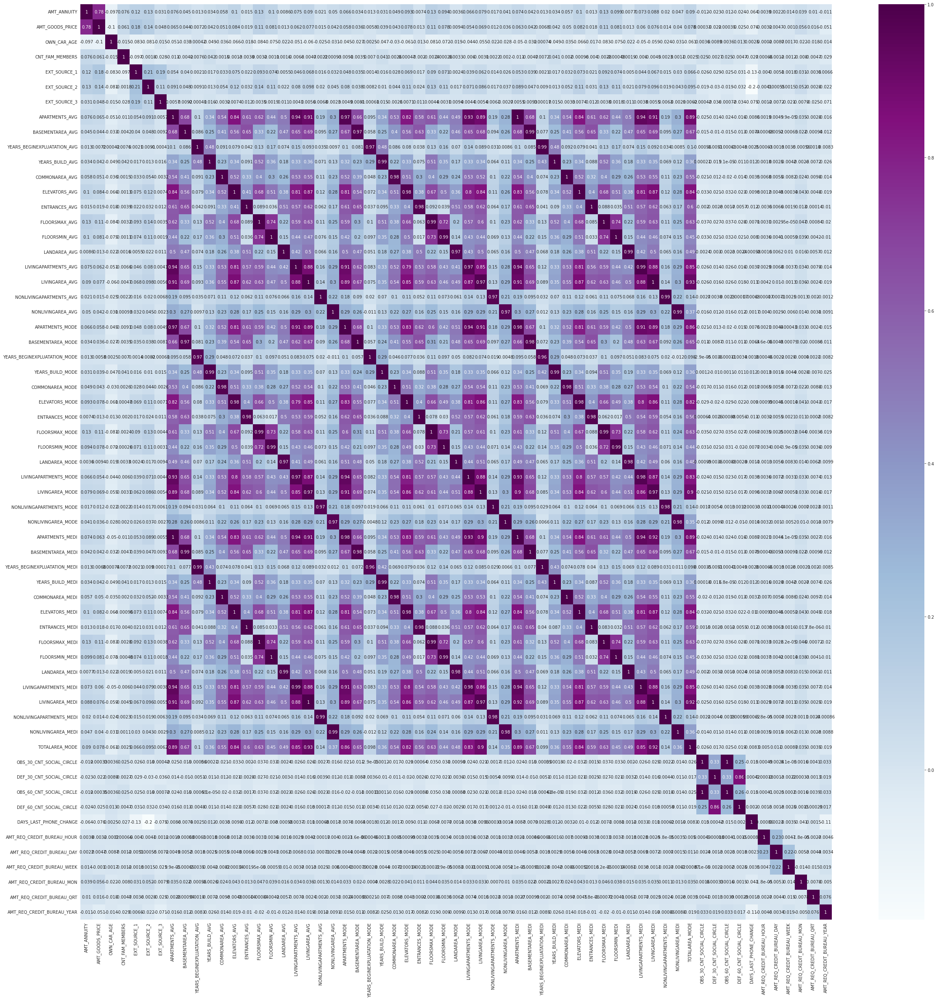

In [172]:
plt.figure(figsize=(40,40))
sns.heatmap(appp_50.corr(),annot=True,cmap='BuPu')

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Dropping columns with high correlation </h3>


In [173]:
datasets['application_train'] = datasets['application_train'].drop(['TOTALAREA_MODE','ELEVATORS_AVG','LIVINGAPARTMENTS_AVG',
                                                                    'LIVINGAREA_AVG','APARTMENTS_MODE','ELEVATORS_MODE',
                                                                    'LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE'
                                             ,'APARTMENTS_MEDI','ELEVATORS_MEDI','LIVINGAPARTMENTS_MEDI','LIVINGAREA_MEDI'],axis=1)

In [174]:
appp_50A = datasets['application_train'][datasets['application_train'].columns[datasets['application_train'].isnull().sum()>0.5]]

<AxesSubplot:>

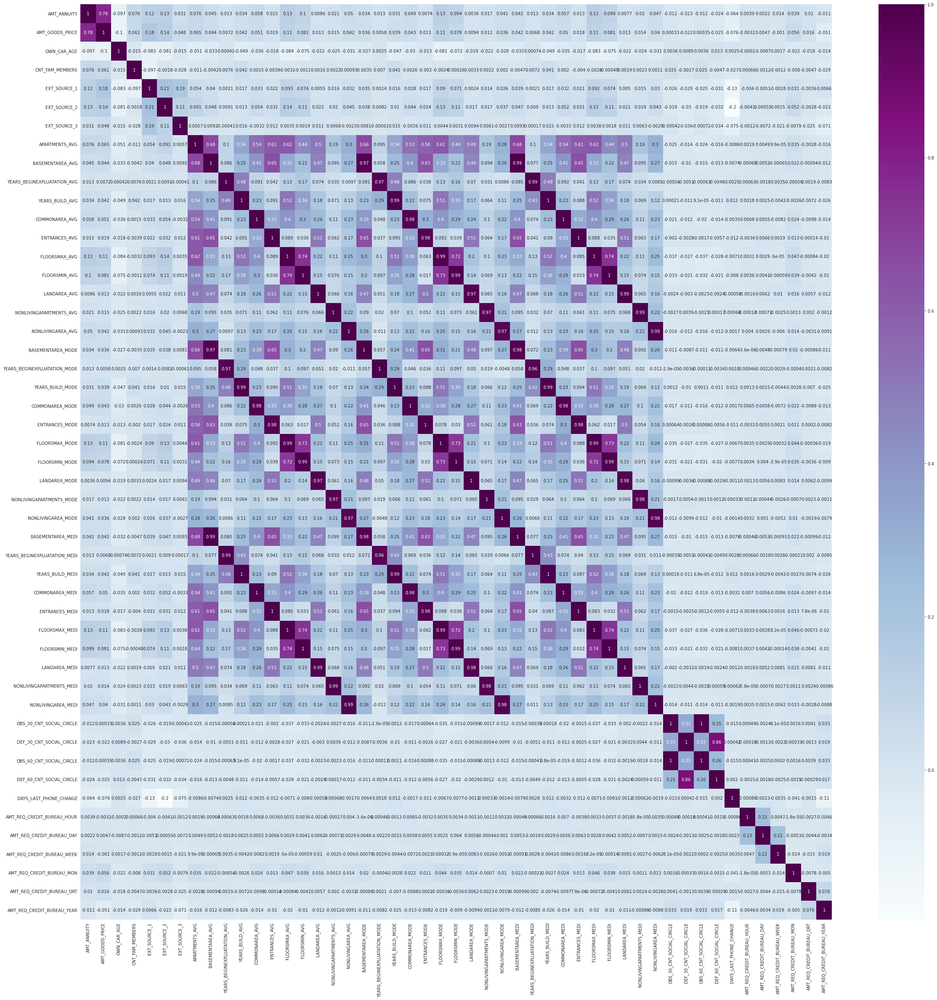

In [175]:
plt.figure(figsize=(40,40))
sns.heatmap(appp_50A.corr(),annot=True, cmap = 'BuPu')

In [176]:
datasets['application_train'] = datasets['application_train'].drop(['NONLIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI','FLOORSMIN_MEDI',
                                                                    'FLOORSMAX_MEDI','ENTRANCES_MEDI','FLOORSMAX_MODE','FLOORSMIN_MODE','BASEMENTAREA_MEDI',
                                                                    'BASEMENTAREA_MODE','YEARS_BUILD_MEDI','NONLIVINGAPARTMENTS_MODE','NONLIVINGAREA_MODE','YEARS_BUILD_MEDI',
                                            'YEARS_BUILD_MODE','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BEGINEXPLUATATION_MODE','COMMONAREA_MEDI','COMMONAREA_MODE',
                                                                    'ENTRANCES_MODE','LANDAREA_MODE','LANDAREA_MEDI','DEF_30_CNT_SOCIAL_CIRCLE','OBS_30_CNT_SOCIAL_CIRCLE',
                                                                    'REG_CITY_NOT_LIVE_CITY','REGION_RATING_CLIENT',
                                                                   'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'FLOORSMIN_AVG','DAYS_LAST_PHONE_CHANGE',
                                                                       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG',
                                                                    'LIVE_CITY_NOT_WORK_CITY','LIVE_REGION_NOT_WORK_REGION','AMT_GOODS_PRICE',
                                                                   'CNT_CHILDREN'
                                                                    
                                                                   ],axis = 1)

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Conclusions of Correlation Matrix </h3>

* After we see that there are many independent or feature variable which are related to each other, we will deal with them in a way that we drop the repetitive features, i.e. delete one of those columns which are highly correlated with each other!
Thus, as we can see above, I have removed all those columns that ae related to each other, just leaving out one!

In [177]:
percent = (datasets["application_train"].isnull().sum()/datasets["application_train"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_train"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
missing_application_train_data.head(20)

,Percent,Train Missing Count
FONDKAPREMONT_MODE,68.39,210295
OWN_CAR_AGE,65.99,202929
LANDAREA_AVG,59.38,182590
BASEMENTAREA_AVG,58.52,179943
EXT_SOURCE_1,56.38,173378
WALLSMATERIAL_MODE,50.84,156341
APARTMENTS_AVG,50.75,156061
ENTRANCES_AVG,50.35,154828
HOUSETYPE_MODE,50.18,154297
FLOORSMAX_AVG,49.76,153020


In [178]:
datasets['application_train'].shape

(307511, 76)

<AxesSubplot:>

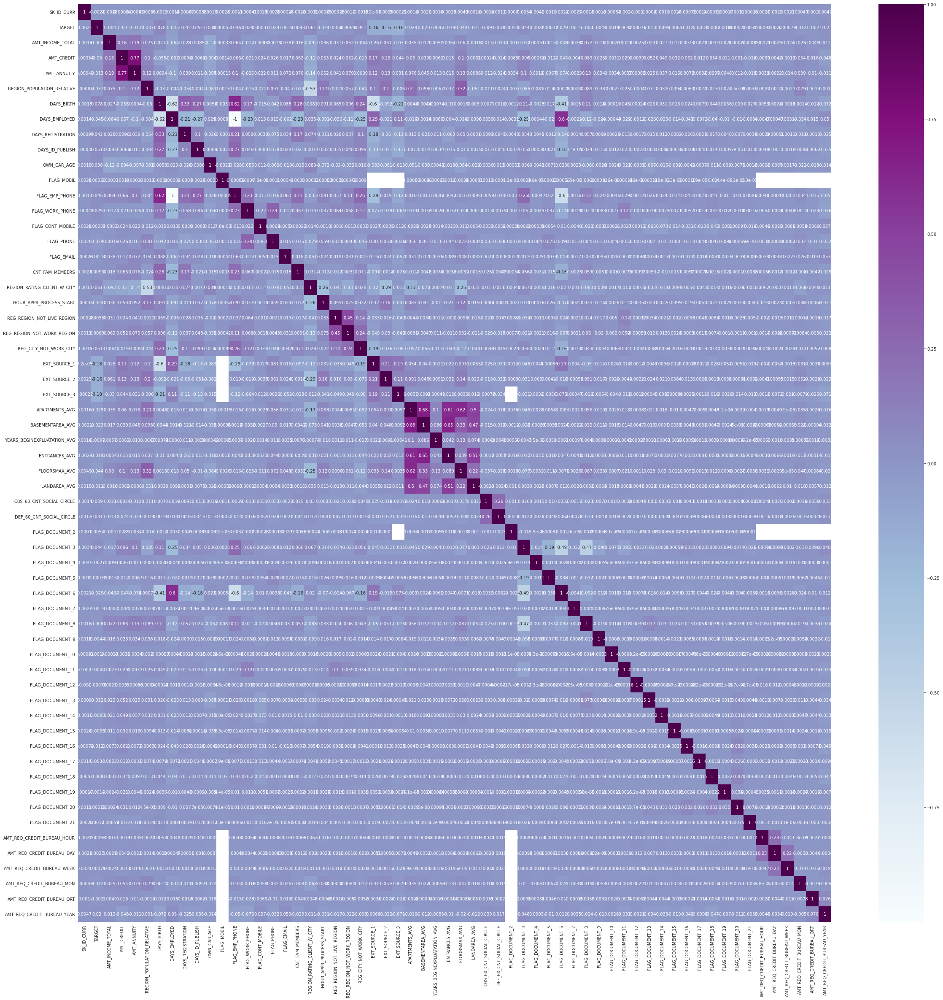

In [179]:
plt.figure(figsize=(40,40))
sns.heatmap(datasets['application_train'].corr(),annot=True, cmap='BuPu')

<h1 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Visual Exploratory Data Analysis </h1>


In [180]:
datasets['application_train'].shape

(307511, 76)

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Idea of Target Variables(Count) </h2>

<AxesSubplot:title={'center':'Count of Default'}, xlabel='TARGET', ylabel='count'>

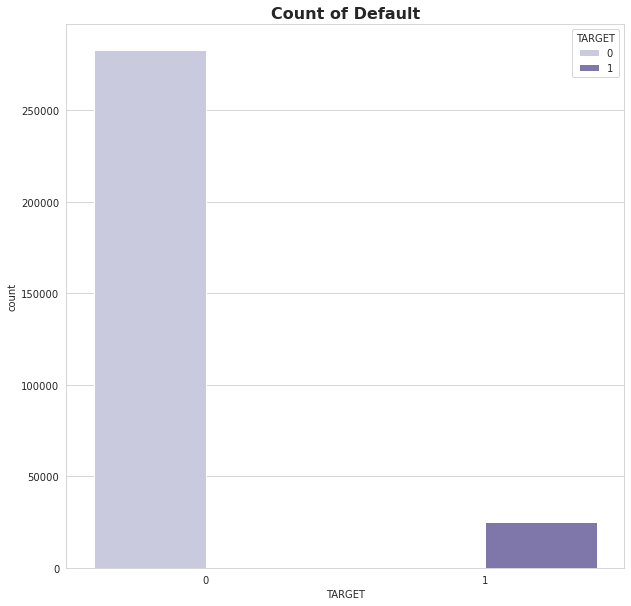

In [181]:
plt.figure(figsize=(10,10))
plt.title("Count of Default", fontweight = 'bold', fontsize = 16)
sns.countplot(x ='TARGET',data=datasets['application_train'], hue='TARGET',palette="Purples")

> People who repaid the loan were almost 10 times than the defaulters.

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Visualization Through Suite Type with respect to Target variable </h2>

<AxesSubplot:title={'center':'Suite Type'}, xlabel='NAME_TYPE_SUITE', ylabel='count'>

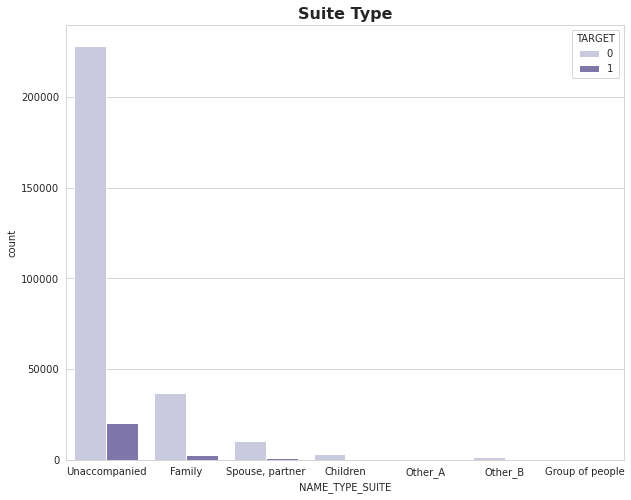

In [182]:
plt.figure(figsize=(10,8))
plt.title("Suite Type", fontweight = 'bold', fontsize = 16)
sns.countplot(datasets['application_train']['NAME_TYPE_SUITE'], hue=datasets['application_train']['TARGET'], palette = 'Purples')

* Above, we have plotted a graph which describes the loan applicant's family members.
* As we can see above, there are  many people who are unaccompanied followed by Family.

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Visualization Through Distribution of Applicant's Family Members Count with respect to Target variable </h2>

<AxesSubplot:title={'center':"Distribution of Applicant's Family Members Count"}, xlabel='CNT_FAM_MEMBERS', ylabel='count'>

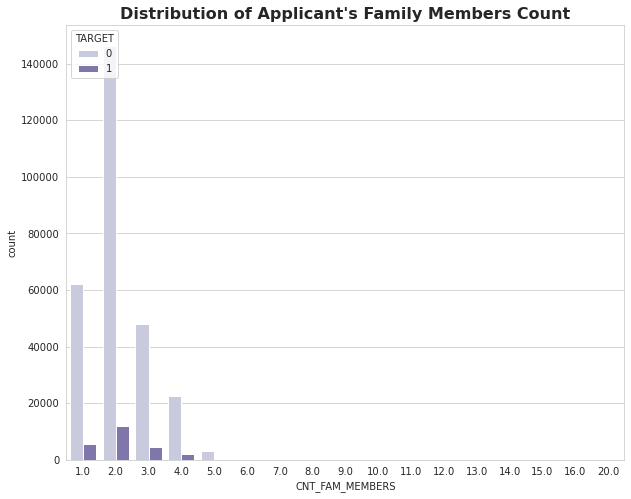

In [183]:
plt.figure(figsize=(10,8))
plt.title("Distribution of Applicant's Family Members Count", fontweight = 'bold', fontsize = 16)
sns.countplot(datasets['application_train']['CNT_FAM_MEMBERS'],hue=datasets['application_train']['TARGET'], palette = 'Purples')



* Above, we have plotted a graph which describes the loan applicant's family members.
* As we can see above, there are hardly any people who have a count of family members greater than 5.


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Correlation of columns with respect to Target Variable </h2> 

In [184]:
datasets['application_train'].corrwith(datasets['application_train']["TARGET"]).sort_values(ascending = False)

TARGET                         1.000000
DAYS_BIRTH                     0.078239
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_ID_PUBLISH                0.051457
REG_CITY_NOT_WORK_CITY         0.050994
FLAG_EMP_PHONE                 0.045982
FLAG_DOCUMENT_3                0.044346
DAYS_REGISTRATION              0.041975
OWN_CAR_AGE                    0.037612
DEF_60_CNT_SOCIAL_CIRCLE       0.031276
FLAG_WORK_PHONE                0.028524
AMT_REQ_CREDIT_BUREAU_YEAR     0.019930
CNT_FAM_MEMBERS                0.009308
OBS_60_CNT_SOCIAL_CIRCLE       0.009022
REG_REGION_NOT_WORK_REGION     0.006942
REG_REGION_NOT_LIVE_REGION     0.005576
FLAG_DOCUMENT_2                0.005417
FLAG_DOCUMENT_21               0.003709
AMT_REQ_CREDIT_BUREAU_DAY      0.002704
AMT_REQ_CREDIT_BUREAU_HOUR     0.000930
AMT_REQ_CREDIT_BUREAU_WEEK     0.000788
FLAG_MOBIL                     0.000534
FLAG_CONT_MOBILE               0.000370
FLAG_DOCUMENT_20               0.000215
FLAG_DOCUMENT_5               -0.000316


> As we can see EXT_SOURCE_1, EXT_SOURCE_2 and EXT_SOURCE_3 are most negatively correlated.

In [185]:
target_corr = pd.DataFrame(datasets['application_train'].corrwith(datasets['application_train']["TARGET"]).sort_values(ascending = False)).reset_index()

In [186]:
target_corr = target_corr.rename(columns={'index':'Column_name',0:'corr_with_target'})

In [187]:
target_corr.head()

,Column_name,corr_with_target
0,TARGET,1.000000
1,DAYS_BIRTH,0.078239
2,REGION_RATING_CLIENT_W_CITY,0.060893
3,DAYS_ID_PUBLISH,0.051457
4,REG_CITY_NOT_WORK_CITY,0.050994


In [188]:
target_corr.tail()

,Column_name,corr_with_target
55,FLOORSMAX_AVG,-0.044003
56,DAYS_EMPLOYED,-0.044932
57,EXT_SOURCE_1,-0.155317
58,EXT_SOURCE_2,-0.160472
59,EXT_SOURCE_3,-0.178919


<h3 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Visualization Through Correlation with TARGET Variable </h3>


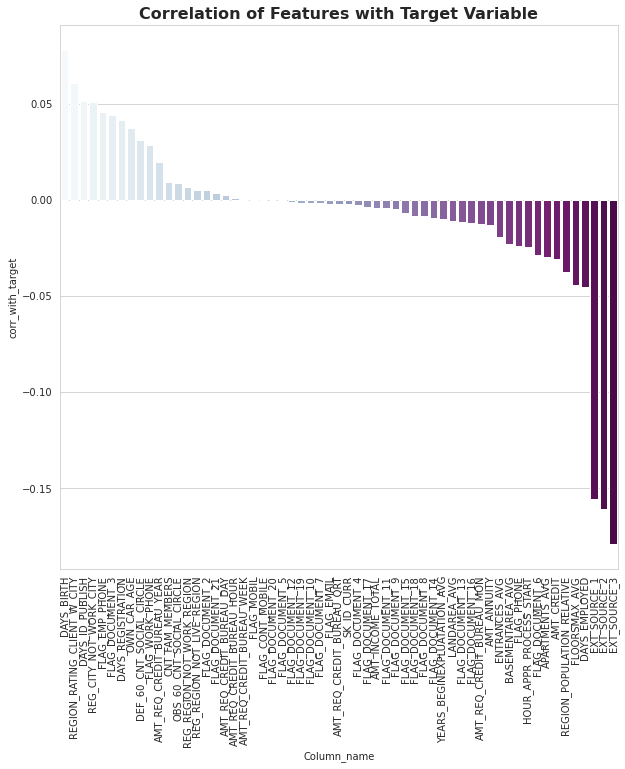

In [189]:
plt.figure(figsize=(10,10))
sns.barplot(data=target_corr,x=target_corr['Column_name'][1:], y= target_corr['corr_with_target'][1:], palette = 'BuPu')
plt.xticks(rotation=90)
plt.title('Correlation of Features with Target Variable', fontweight = 'bold', fontsize = 16)
plt.show()

> Above, we have plotted the graph of correlation of all the features with the target variable. As it can be seen above, there are **approximately 30%** features which are not at all correlated with the target variable.  We can drop them as I do not believe that they will influence our predictions of the target variable!

> Removing more columns on the basis of correlation with target variable.

In [190]:
datasets['application_train'] = datasets['application_train'].drop(['AMT_REQ_CREDIT_BUREAU_HOUR',
'AMT_REQ_CREDIT_BUREAU_WEEK', 
'FLAG_MOBIL',                    
'FLAG_CONT_MOBILE',              
'FLAG_DOCUMENT_20',              
'FLAG_DOCUMENT_5',               
'FLAG_DOCUMENT_12',              
'FLAG_DOCUMENT_19',
'FLAG_DOCUMENT_10',
'FLAG_DOCUMENT_7'],axis=1)

In [191]:
target_corr1 = pd.DataFrame(datasets['application_train'].corrwith(datasets['application_train']["TARGET"]).sort_values(ascending = False)).reset_index()

In [192]:
target_corr1 = target_corr1.rename(columns={'index':'Column_name',0:'corr_with_target'})

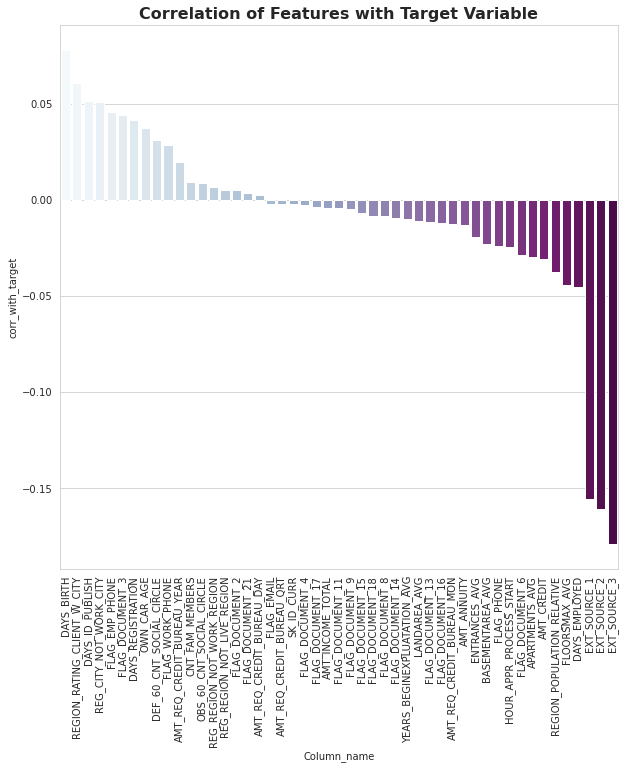

In [193]:
plt.figure(figsize=(10,10))
sns.barplot(data=target_corr1,x=target_corr1['Column_name'][1:], y= target_corr1['corr_with_target'][1:], palette = 'BuPu')
plt.xticks(rotation=90)
plt.title('Correlation of Features with Target Variable', fontweight = 'bold', fontsize = 16)
plt.show()

In [194]:
datasets['application_train'].corrwith(datasets['application_train']["TARGET"]).sort_values(ascending = False)

TARGET                         1.000000
DAYS_BIRTH                     0.078239
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_ID_PUBLISH                0.051457
REG_CITY_NOT_WORK_CITY         0.050994
FLAG_EMP_PHONE                 0.045982
FLAG_DOCUMENT_3                0.044346
DAYS_REGISTRATION              0.041975
OWN_CAR_AGE                    0.037612
DEF_60_CNT_SOCIAL_CIRCLE       0.031276
FLAG_WORK_PHONE                0.028524
AMT_REQ_CREDIT_BUREAU_YEAR     0.019930
CNT_FAM_MEMBERS                0.009308
OBS_60_CNT_SOCIAL_CIRCLE       0.009022
REG_REGION_NOT_WORK_REGION     0.006942
REG_REGION_NOT_LIVE_REGION     0.005576
FLAG_DOCUMENT_2                0.005417
FLAG_DOCUMENT_21               0.003709
AMT_REQ_CREDIT_BUREAU_DAY      0.002704
FLAG_EMAIL                    -0.001758
AMT_REQ_CREDIT_BUREAU_QRT     -0.002022
SK_ID_CURR                    -0.002108
FLAG_DOCUMENT_4               -0.002672
FLAG_DOCUMENT_17              -0.003378
AMT_INCOME_TOTAL              -0.003982


In [195]:
datasets['application_train'] = datasets['application_train'].drop(['REG_REGION_NOT_WORK_REGION',    
'REG_REGION_NOT_LIVE_REGION',    
'FLAG_DOCUMENT_2',               
'FLAG_DOCUMENT_21',               
'AMT_REQ_CREDIT_BUREAU_DAY',      
'FLAG_EMAIL',                    
'AMT_REQ_CREDIT_BUREAU_QRT',                    
'FLAG_DOCUMENT_4',              
'FLAG_DOCUMENT_17',             
'FLAG_DOCUMENT_11',              
'FLAG_DOCUMENT_9',              
'FLAG_DOCUMENT_15',            
'FLAG_DOCUMENT_18',             
'FLAG_DOCUMENT_8'],axis=1)

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3	">Top 5 Correlated features with Target Variable </h3>


In [251]:
df = pd.DataFrame(datasets['application_train'].corrwith(datasets['application_train']["TARGET"]).sort_values(ascending = False))
df1 = datasets['application_train'][['FLOORSMAX_AVG','DAYS_EMPLOYED','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3','TARGET']]
df1.dropna(inplace=True)
df1.head()


,FLOORSMAX_AVG,DAYS_EMPLOYED,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,TARGET
0,0.0833,-637,0.083037,0.262949,0.139376,1
12,0.1667,-2717,0.464831,0.715042,0.176653,0
25,0.1667,-3494,0.561948,0.651406,0.461482,0
50,0.4083,-1176,0.656225,0.450850,0.479449,0
51,0.4583,-6977,0.311510,0.713355,0.309275,0


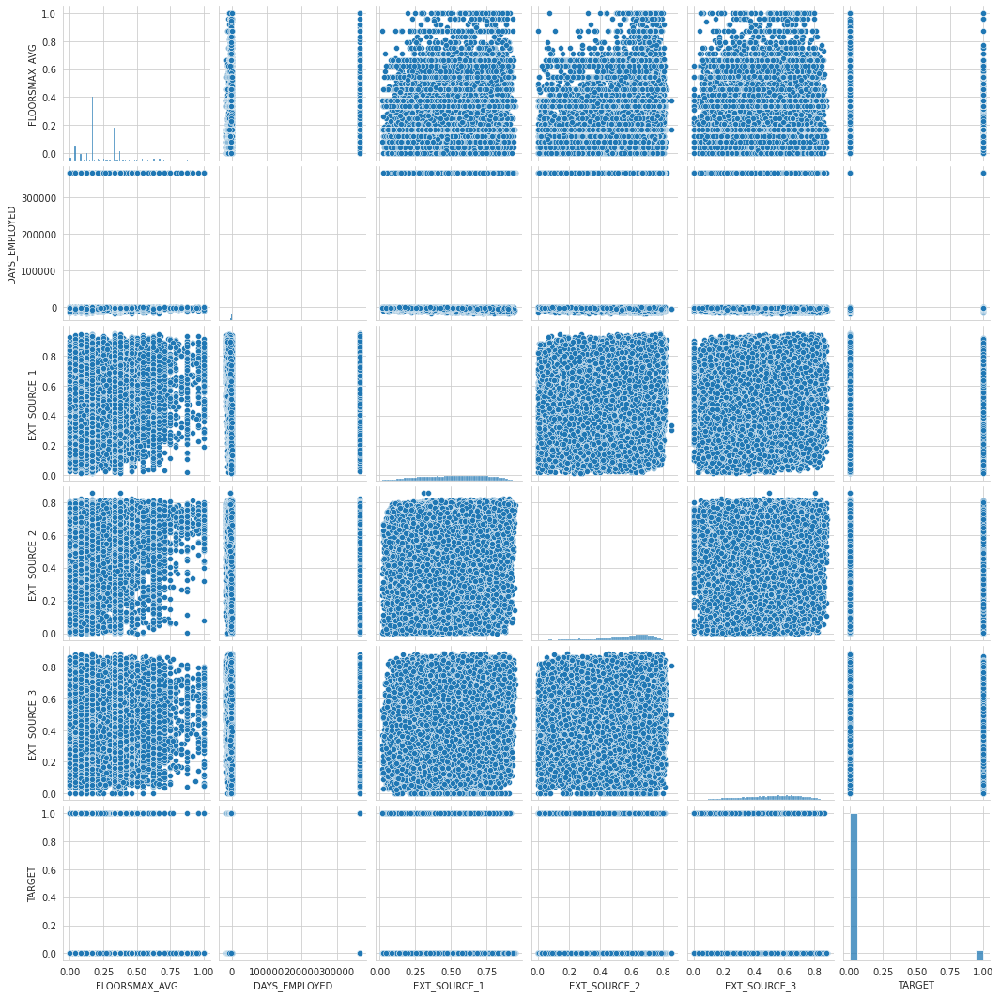

In [254]:
sns.pairplot(df1,palette='Purples')
plt.show()

In [197]:
target_corr2 = pd.DataFrame(datasets['application_train'].corrwith(datasets['application_train']["TARGET"]).sort_values(ascending = False)).reset_index()

In [198]:
target_corr2 = target_corr2.rename(columns={'index':'Column_name',0:'corr_with_target'})

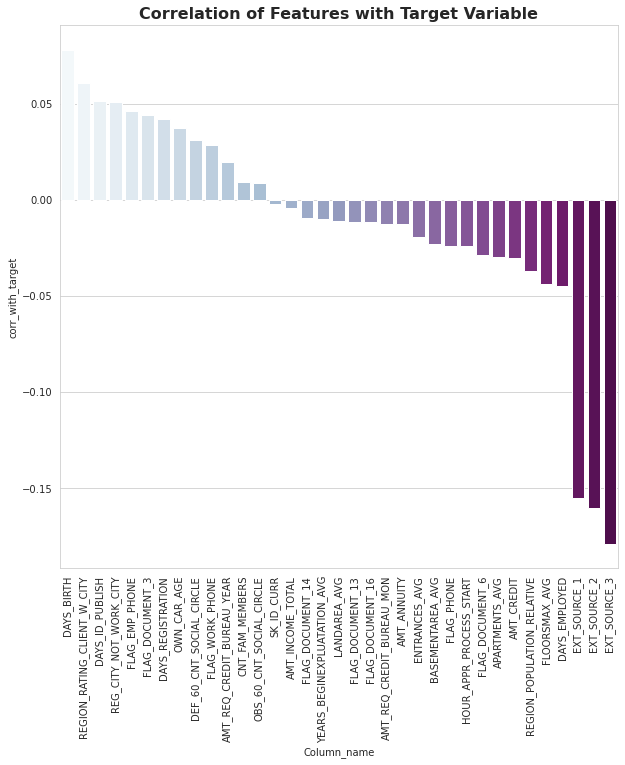

In [199]:
plt.figure(figsize=(10,10))
sns.barplot(data=target_corr2,x=target_corr2['Column_name'][1:], y= target_corr2['corr_with_target'][1:], palette = 'BuPu')
plt.xticks(rotation=90)
plt.title('Correlation of Features with Target Variable', fontweight = 'bold', fontsize = 16)
plt.show()

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Conclusion from the Correlation Matrix </h2>

> After we have dropped the unimportant or unrelated columns, we have plotted the correlation with the TARGET variable! This looks so much better than before. We can see that the remaning variables are quite correlated with the TARGET Variable!



In [200]:
datasets['application_train'].info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 52 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   AMT_INCOME_TOTAL             307511 non-null  float64
 7   AMT_CREDIT                   307511 non-null  float64
 8   AMT_ANNUITY                  307499 non-null  float64
 9   NAME_TYPE_SUITE              306219 non-null  object 
 10  NAME_INCOME_TYPE             307511 non-null  object 
 11  NAME_EDUCATION_TYPE          307511 non-null  object 
 12  NAME_FAMILY_STATUS           307511 non-null  object 
 13 

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Visualization Through Correlation Matrix </h3>

The **info()** function is used to print a concise summary of a DataFrame. This method prints information about a DataFrame including the index dtype and column dtypes, non-null values and memory usage.

we see that we have a lot of float, numeric, int and object data type values in the dataset!


<h3 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Who's the highest borrower </h3>

<AxesSubplot:title={'center':'Whos is the highest borrower?'}, xlabel='CODE_GENDER', ylabel='count'>

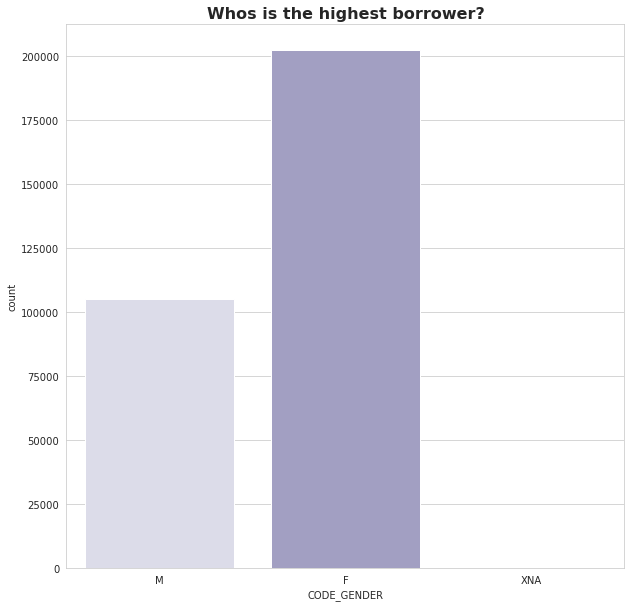

In [201]:
sns.set_style('whitegrid')
plt.figure(figsize = (10,10))
plt.title("Whos is the highest borrower?", fontweight = 'bold', fontsize = 16)
sns.countplot(x='CODE_GENDER',data=datasets['application_train'], palette = 'Purples')

<h4 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Insights: </h4>

Basically, there are more number of females than the number of males in the dataset! Thus one may also conclude that FEMALES take more loans than the MALES!
But it might be incorrect to assume that!

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Who's the highest borrower </h3>

<AxesSubplot:title={'center':'Who owns most number of the cars?'}, xlabel='CODE_GENDER', ylabel='count'>

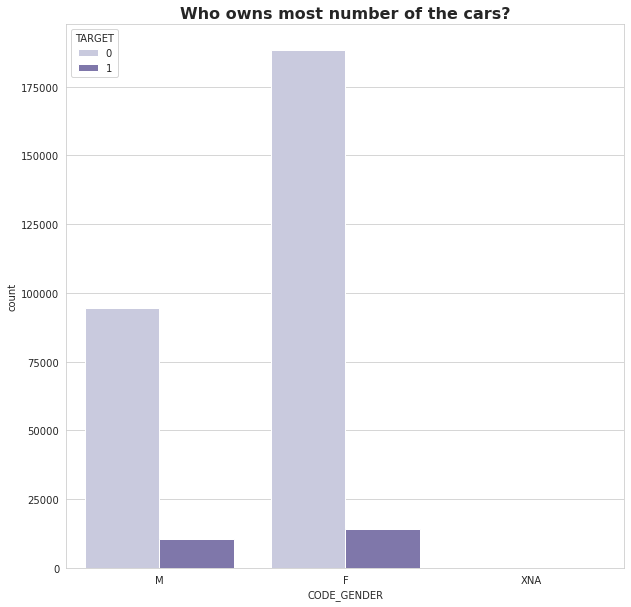

In [202]:
plt.figure(figsize=(10,10))
plt.title("Who owns most number of the cars?", fontweight = 'bold', fontsize = 16) 
sns.countplot(x='CODE_GENDER',data= datasets['application_train'], hue='TARGET', palette="Purples")

<h4 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Conclusions: </h4>

> In this plot we have drawn a graph whther or not person i.e man or woman defaults a loan. However, the count of females is higher than the count of males, the graph says something different. The number of females owning a car is more than the number of males owning a car and percent wise they default less.


<AxesSubplot:title={'center':'Whether is it Female who has more difficulties or is it Male?'}, xlabel='TARGET', ylabel='count'>

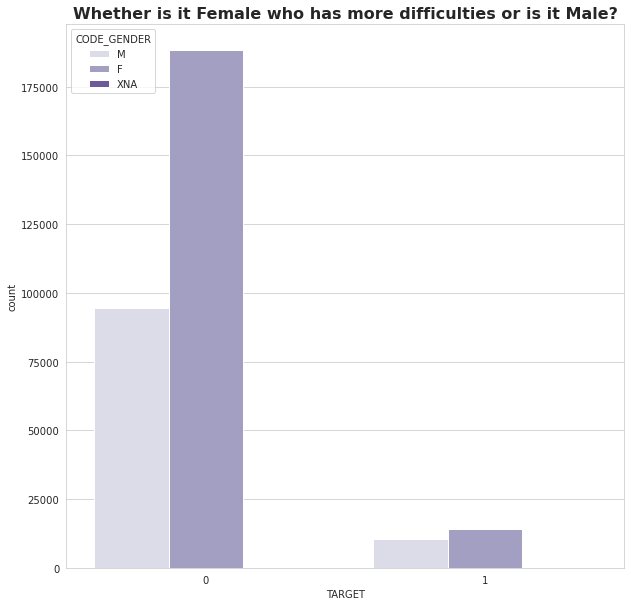

In [203]:
plt.figure(figsize=(10,10))
plt.title("Whether is it Female who has more difficulties or is it Male?", fontweight = 'bold', fontsize= 16)
sns.countplot(x='TARGET',hue='CODE_GENDER',data=datasets['application_train'], palette = 'Purples')

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Insights: </h3>
It appears that Females have much more of difficulty in gettng the loans as compared to the males.

<AxesSubplot:title={'center':'Loan Default according to the Type of Loans'}, xlabel='TARGET', ylabel='count'>

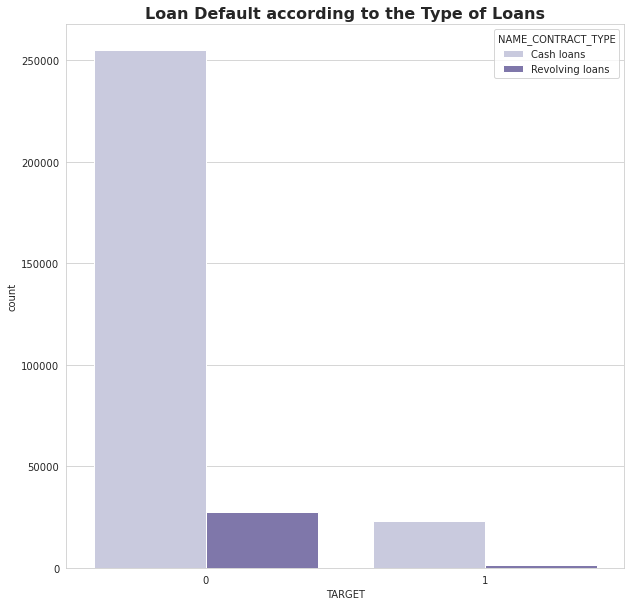

In [204]:
plt.figure(figsize=(10,10))
plt.title("Loan Default according to the Type of Loans",fontweight='bold' , fontsize =16)
sns.countplot(x='TARGET',hue='NAME_CONTRACT_TYPE',data=datasets['application_train'], palette = 'Purples')

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Insights: </h3>
It appears that cash loans are majority in defaulting the laons.

<AxesSubplot:title={'center':'Loan Default with respect to property owned'}, xlabel='TARGET', ylabel='count'>

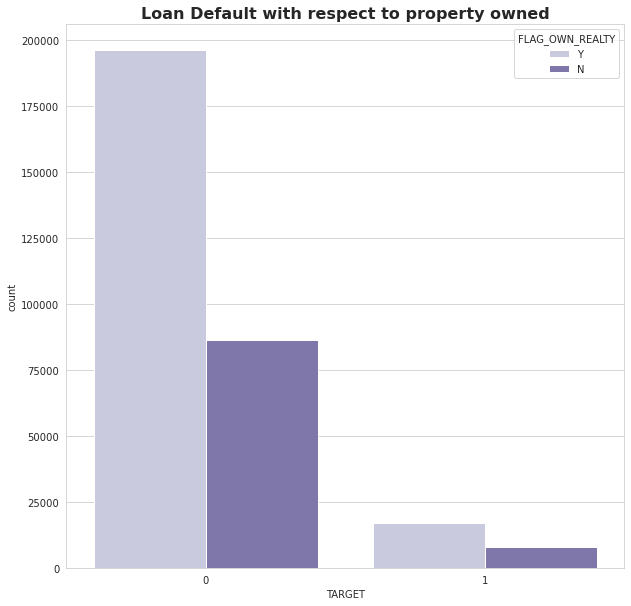

In [205]:
plt.figure(figsize=(10,10))
plt.title("Loan Default with respect to property owned",fontweight='bold' , fontsize =16)
sns.countplot(x='TARGET',hue='FLAG_OWN_REALTY',data=datasets['application_train'], palette = 'Purples')

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Insights: </h3>
It appears that there is not much difference in the percent of defaults with respect to the property owned.

<AxesSubplot:title={'center':'Loan Default with respect to type of suite'}, xlabel='NAME_TYPE_SUITE', ylabel='count'>

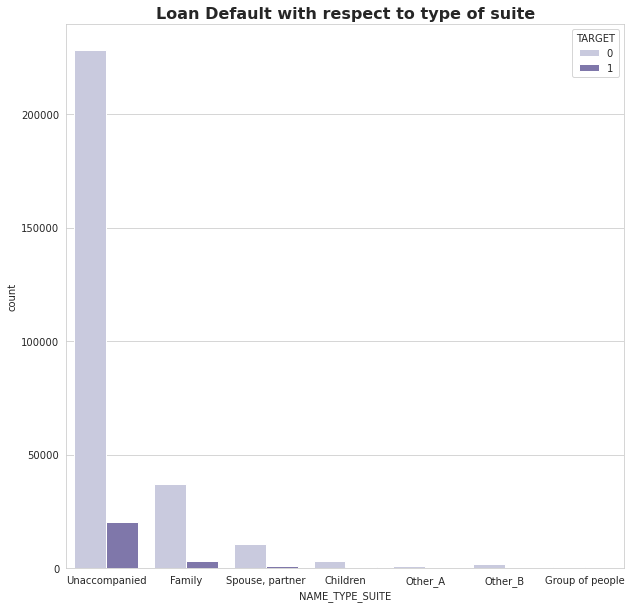

In [206]:
plt.figure(figsize=(10,10))
plt.title("Loan Default with respect to type of suite",fontweight='bold' , fontsize =16)
sns.countplot(x='NAME_TYPE_SUITE',hue='TARGET',data=datasets['application_train'], palette = 'Purples')

<AxesSubplot:title={'center':'Loan Default with respect to education type'}, xlabel='NAME_EDUCATION_TYPE', ylabel='count'>

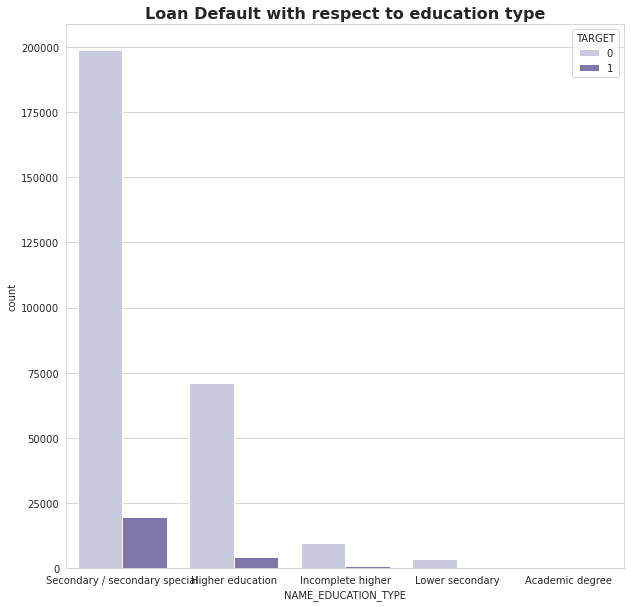

In [207]:
plt.figure(figsize=(10,10))
plt.title("Loan Default with respect to education type",fontweight='bold' , fontsize =16)
sns.countplot(x='NAME_EDUCATION_TYPE',hue='TARGET',data=datasets['application_train'], palette = 'Purples')

<AxesSubplot:title={'center':'Loan Default with respect to income type'}, xlabel='NAME_INCOME_TYPE', ylabel='count'>

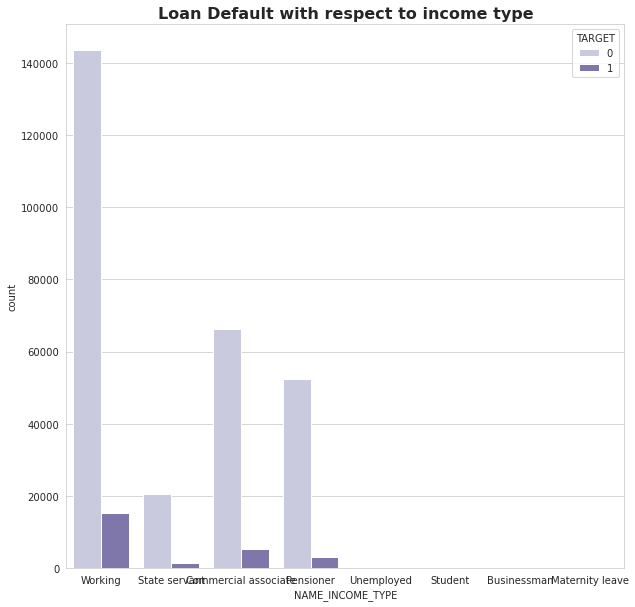

In [208]:
plt.figure(figsize=(10,10))
plt.title("Loan Default with respect to income type",fontweight='bold' , fontsize =16)
sns.countplot(x='NAME_INCOME_TYPE',hue='TARGET',data=datasets['application_train'], palette = 'Purples')

In [209]:
datasets['application_train'].info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 52 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   AMT_INCOME_TOTAL             307511 non-null  float64
 7   AMT_CREDIT                   307511 non-null  float64
 8   AMT_ANNUITY                  307499 non-null  float64
 9   NAME_TYPE_SUITE              306219 non-null  object 
 10  NAME_INCOME_TYPE             307511 non-null  object 
 11  NAME_EDUCATION_TYPE          307511 non-null  object 
 12  NAME_FAMILY_STATUS           307511 non-null  object 
 13 

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Seperating categorical and numerical data for Visualization </h2>
It appears that there is not much difference in the percent of defaults with respect to the property owned.

In [210]:
categorical_df= datasets['application_train'].select_dtypes(include='object')
categorical_df

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN,NaN
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,Cash loans,M,N,N,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,Sales staff,THURSDAY,Services,reg oper account,block of flats,"Stone, brick",No
307507,Cash loans,F,N,Y,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,NaN,MONDAY,XNA,reg oper account,block of flats,"Stone, brick",No
307508,Cash loans,F,N,Y,Unaccompanied,Working,Higher education,Separated,House / apartment,Managers,THURSDAY,School,reg oper account,block of flats,Panel,No
307509,Cash loans,F,N,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 1,NaN,block of flats,"Stone, brick",No


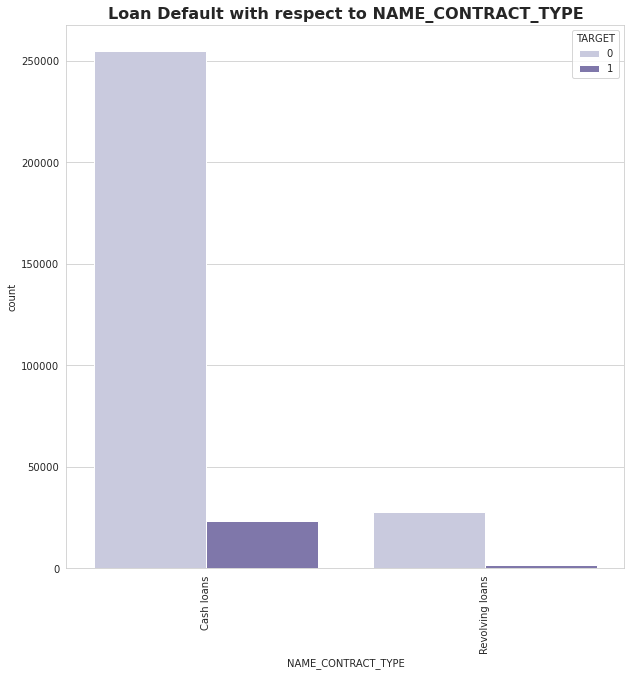

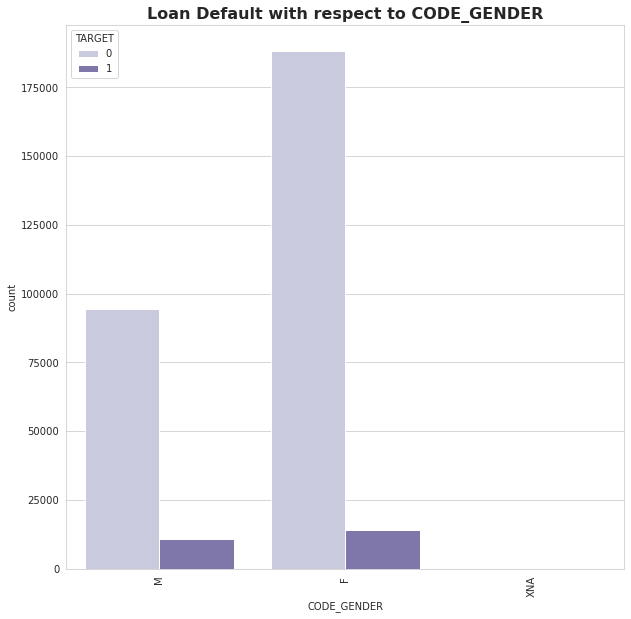

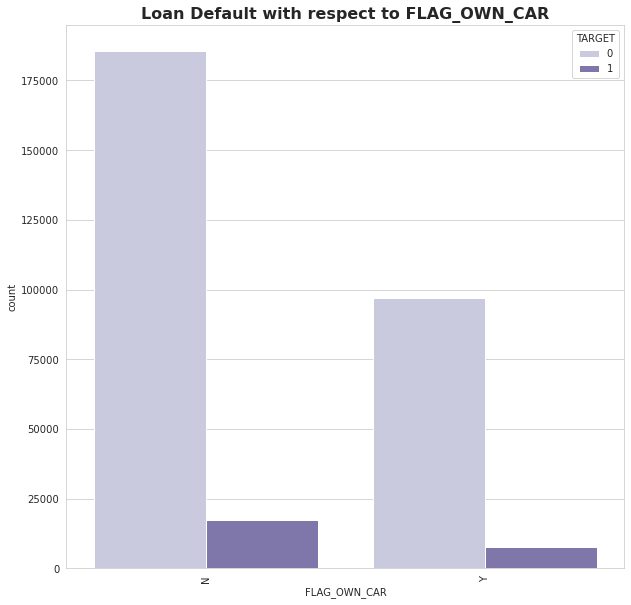

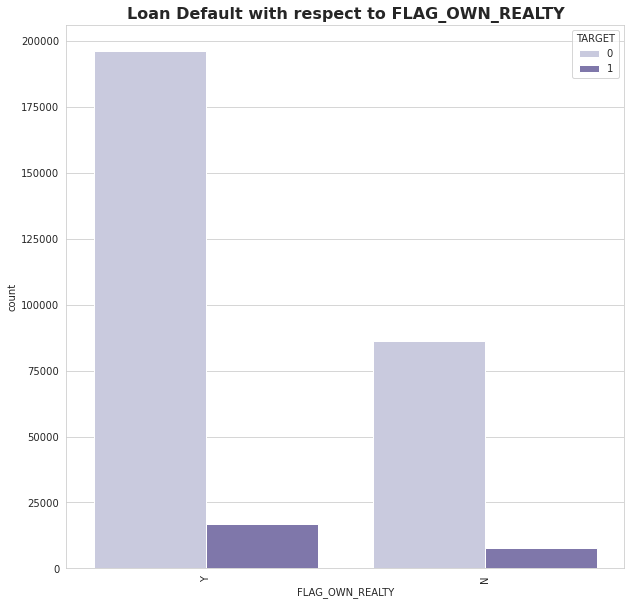

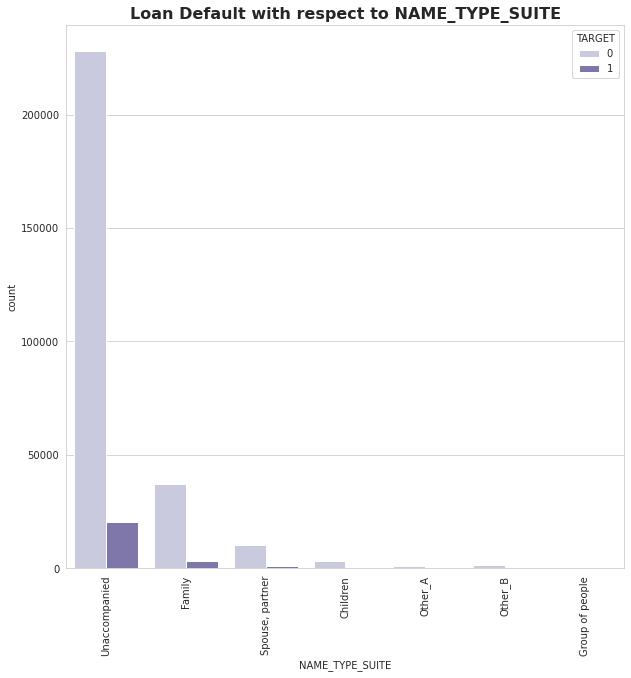

...

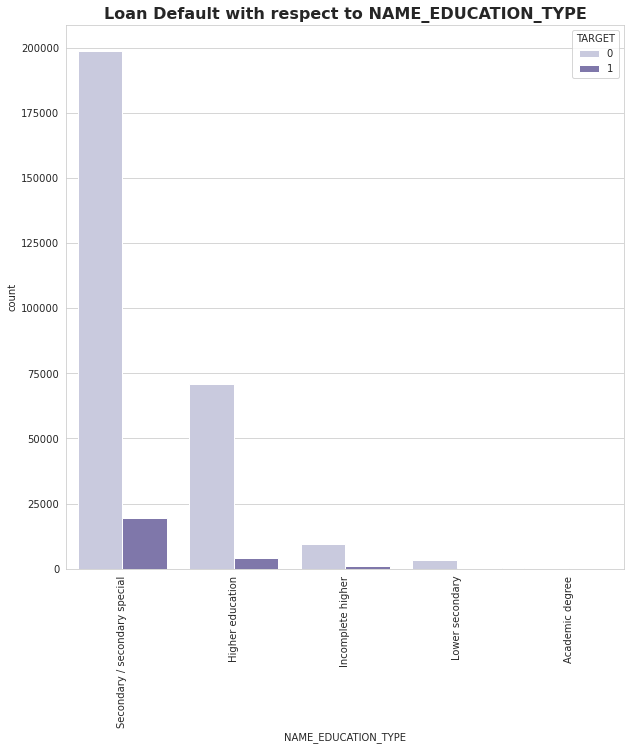

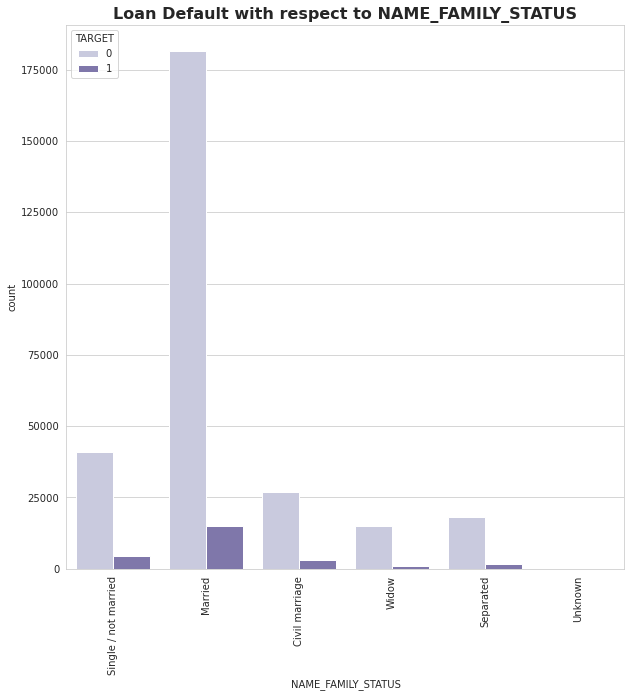

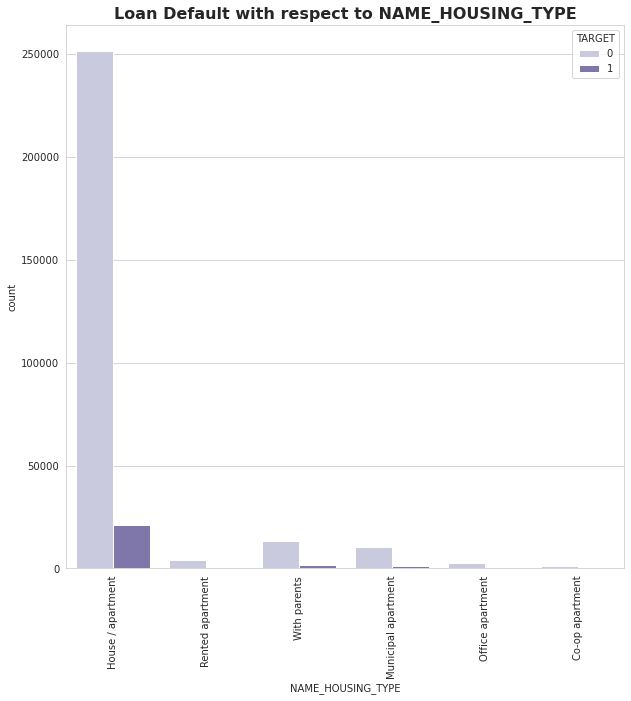

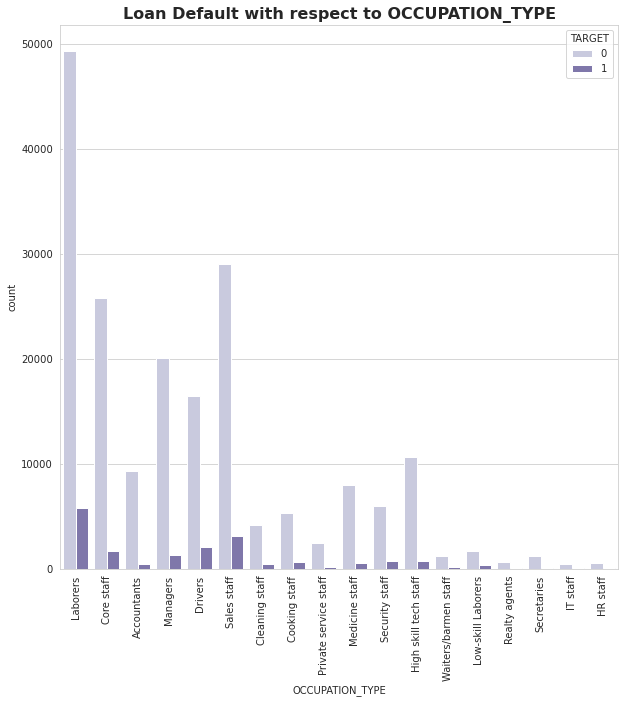

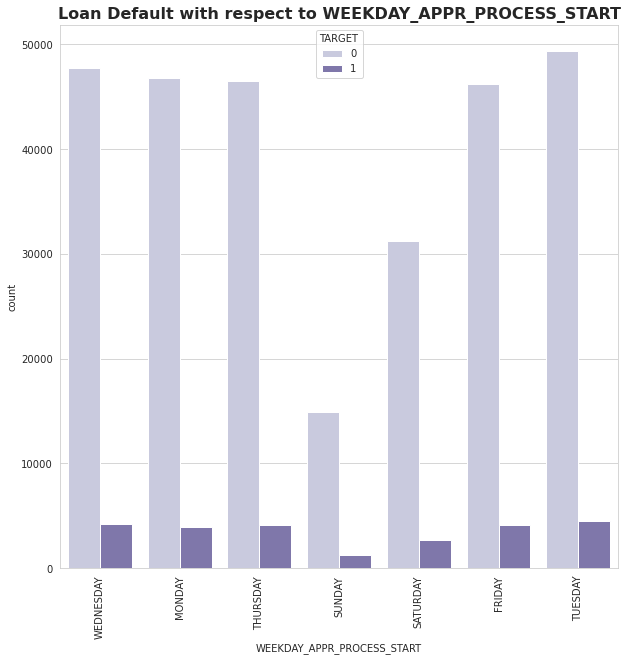

In [216]:
for cat in categorical_df.columns.values[:11]:
        plt.figure(figsize=(10,10))
        title= "Loan Default with respect to "+ str(cat)
        plt.title(title,fontweight='bold' , fontsize =16)
        sns.countplot(x=categorical_df[cat],hue='TARGET',data=datasets['application_train'], palette = 'Purples')
        plt.xticks(rotation=90)

In [213]:
integer_df1= datasets['application_train'].select_dtypes(include='int64')
integer_df1
float_df1 = datasets['application_train'].select_dtypes(include='float64')

In [214]:
integer_df1


,SK_ID_CURR,TARGET,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_PHONE,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_CITY_NOT_WORK_CITY,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16
0,100002,1,-9461,-637,-2120,1,0,1,2,10,0,1,0,0,0,0
1,100003,0,-16765,-1188,-291,1,0,1,1,11,0,1,0,0,0,0
2,100004,0,-19046,-225,-2531,1,1,1,2,9,0,0,0,0,0,0
3,100006,0,-19005,-3039,-2437,1,0,0,2,17,0,1,0,0,0,0
4,100007,0,-19932,-3038,-3458,1,0,0,2,11,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,-9327,-236,-1982,1,0,0,1,15,0,0,0,0,0,0
307507,456252,0,-20775,365243,-4090,0,0,1,2,8,0,1,0,0,0,0
307508,456253,0,-14966,-7921,-5150,1,0,0,3,9,1,1,0,0,0,0
307509,456254,1,-11961,-4786,-931,1,0,0,2,9,1,1,0,0,0,0


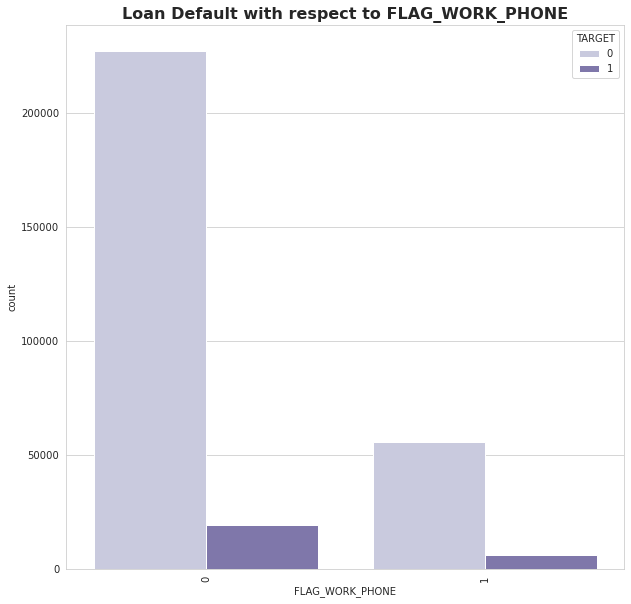

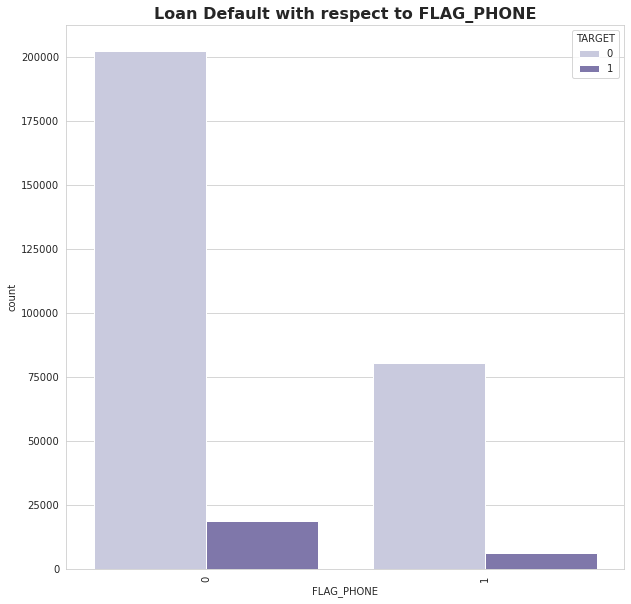

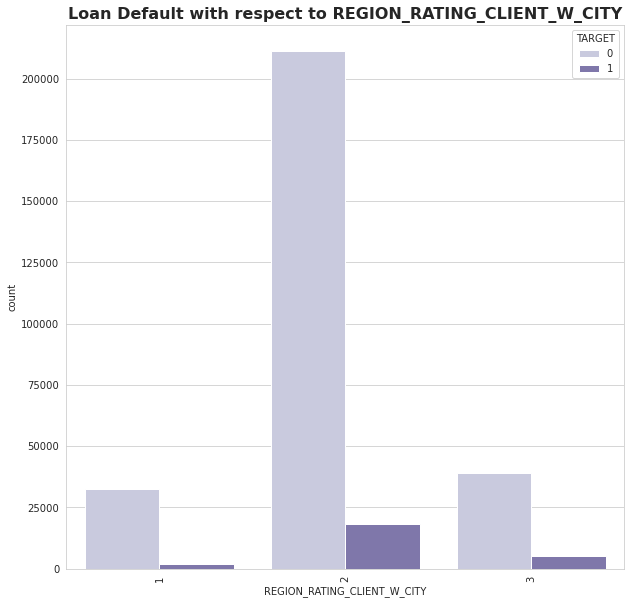

In [217]:
for integer in integer_df1.columns.values[6:9]:
        plt.figure(figsize=(10,10))
        title= "Loan Default with respect to "+ str(integer)
        plt.title(title,fontweight='bold' , fontsize =16)
        sns.countplot(x=integer_df1[integer],hue='TARGET',data=datasets['application_train'], palette = 'Purples')
        plt.xticks(rotation=90)

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Who are major borrowers and what are their occupations </h2>

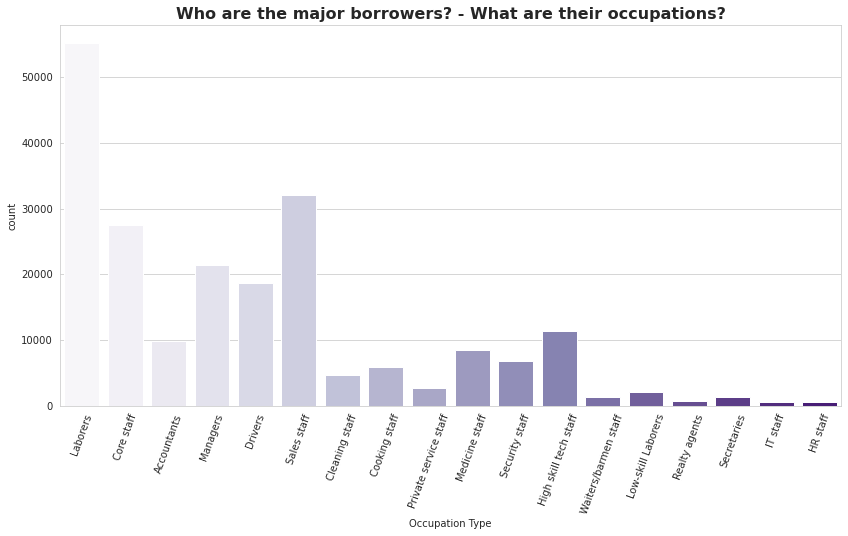

In [218]:
fig, ax = plt.subplots(figsize=(14,7))
sns.countplot(x='OCCUPATION_TYPE',data=datasets['application_train'], palette = 'Purples')
plt.xlabel("Occupation Type")
plt.title("Who are the major borrowers? - What are their occupations?", fontweight='bold',fontsize=16)
plt.xticks(rotation=70)
plt.show()

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	">How economically stable are clients? Who are the most and least stable? </h2>

Text(0.5, 1.0, 'How economically stable are clients? Who are the most and least stable?')

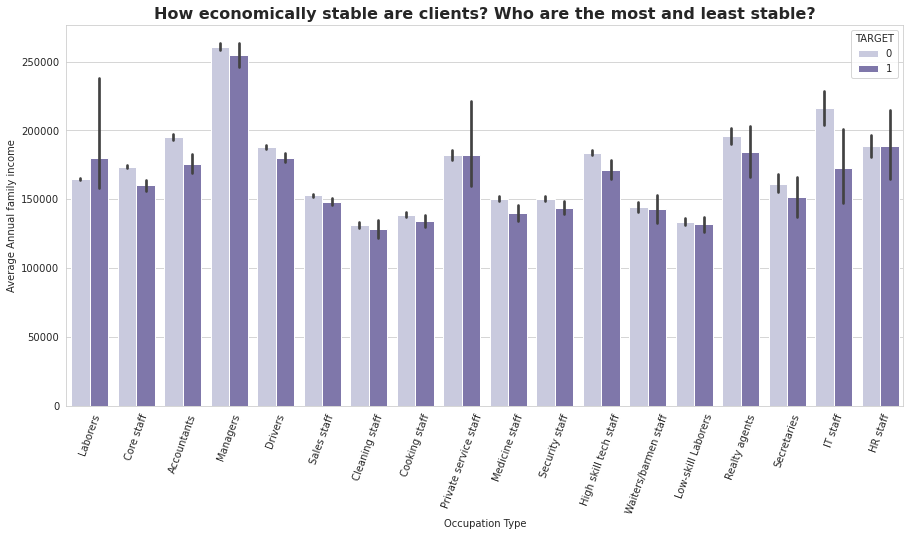

In [219]:
fig, ax = plt.subplots(figsize=(15,7))
sns.barplot(x='OCCUPATION_TYPE',y='AMT_INCOME_TOTAL',hue='TARGET',data=datasets['application_train'],palette='Purples')
plt.xticks(rotation=70)
plt.xlabel("Occupation Type")
plt.ylabel("Average Annual family income")
plt.title("How economically stable are clients? Who are the most and least stable?",fontweight='bold',fontsize=16)

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Value Counts in Categorical Features </h2>

In [82]:
datasets['application_train'].select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Which category of occupants repay on time and are better clients for company to lend money?' </h2>


Text(0.5, 1.0, 'Which category of occupants repay on time and are better clients for company to lend money?')

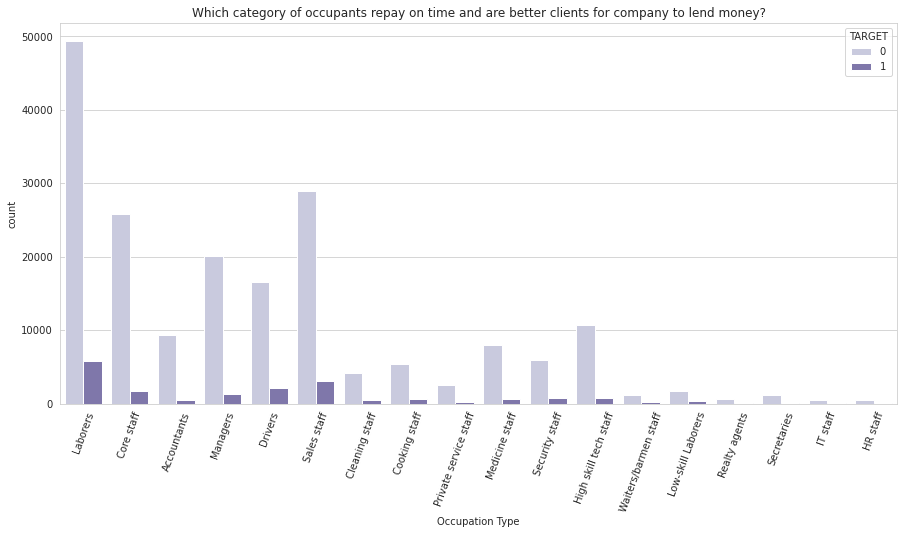

In [83]:
fig, ax = plt.subplots(figsize=(15,7))
sns.countplot(x='OCCUPATION_TYPE',hue='TARGET',data=datasets['application_train'],palette="Purples")
plt.xticks(rotation=70)
plt.xlabel("Occupation Type")
plt.title('Which category of occupants repay on time and are better clients for company to lend money?')


<h1 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Preprocessing </h1>

Data preprocessing is an integral step in Machine Learning as the quality of data and the useful information that can be derived from it directly affects the ability of our model to learn; therefore, it is extremely important that we preprocess our data before feeding it into our model.
The concepts that I will cover for this section of the project are-
* Handling Null Values
* Standardization
* Handling Categorical Variables
* One-Hot Encoding


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Importing the necessary modules </h2>


In [220]:
from sklearn.pipeline import Pipeline, FeatureUnion, make_pipeline
from sklearn.compose import ColumnTransformer
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.model_selection import train_test_split  # sklearn.cross_validation in old versions
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from time import time

In [221]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Splitting the data into train and test Data </h2>

> We are going to split the data into train and test Data so that we can perform a check on our model afterwards.

In [230]:
from sklearn.model_selection import train_test_split

In [231]:
datasets['application_train'].head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,...,EMERGENCYSTATE_MODE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,202500.0,406597.5,24700.5,Unaccompanied,...,No,2.0,2.0,1,0,0,0,0,0.0,1.0
1,100003,0,Cash loans,F,N,N,270000.0,1293502.5,35698.5,Family,...,No,1.0,0.0,1,0,0,0,0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,67500.0,135000.0,6750.0,Unaccompanied,...,NaN,0.0,0.0,0,0,0,0,0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,135000.0,312682.5,29686.5,Unaccompanied,...,NaN,2.0,0.0,1,0,0,0,0,NaN,NaN
4,100007,0,Cash loans,M,N,Y,121500.0,513000.0,21865.5,Unaccompanied,...,NaN,0.0,0.0,0,0,0,0,0,0.0,0.0


In [232]:
X = datasets['application_train'].drop(['TARGET'],axis=1)
y = datasets['application_train']['TARGET']

In [233]:
y = pd.DataFrame(y, columns = ["TARGET"])
y

,TARGET
0,1
1,0
2,0
3,0
4,0
...,...
307506,0
307507,0
307508,0
307509,1


In [234]:
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2,random_state=42)

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Seperating numerical and categorical variables to fit in Pipeline </h2>

In [249]:
integer_df= X.select_dtypes(include='int64')
float_df = X.select_dtypes(include='float64')
numerical_df = list(pd.concat([integer_df,float_df], axis=1))
categorical_df = list(X.select_dtypes(include='object'))
print(categorical_df)
print('                               ')
print(numerical_df)

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']
                               
['SK_ID_CURR', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_16', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'OWN_CAR_AGE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'LANDAREA_AVG', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Build processing pipelines </h2>
In this part of the project the focus is on constructing the pipeline. Since the data has both numerical and categorical features, it is required to create two pipelines (one for each category of data) because they require different transformations. After finishing that, the two pipelines should be unified to produce one full pipeline that performs transformation on all the dataset.

In [239]:
num_pipeline = Pipeline([
    ('scaler', StandardScaler()), 
    ('imputer', SimpleImputer(strategy = 'median')) 
])
cat_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

In [240]:
data_pipeline = ColumnTransformer([
    ("num_pipeline", num_pipeline, numerical_df),
    ("cat_pipeline", cat_pipeline, categorical_df)], remainder = 'drop')

X_train_transformed = data_pipeline.fit_transform(X_train)


In [241]:
column_names = numerical_df  + \
               list(data_pipeline.transformers_[1][1].named_steps["ohe"].get_feature_names(categorical_df)) 

pd.DataFrame(X_train_transformed, columns=column_names).head()

,SK_ID_CURR,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_PHONE,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_CITY_NOT_WORK_CITY,...,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
0,-0.341075,-1.676136,2.132885,-0.937673,-2.132831,-0.498325,-0.624639,-0.063023,-0.937369,-0.546756,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,-1.619000,1.173499,-0.452704,-0.269054,0.468860,2.006722,1.600924,-0.063023,-1.549357,-0.546756,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,-1.003644,-1.644952,-0.467140,-1.335928,0.468860,-0.498325,-0.624639,-0.063023,0.286606,-0.546756,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,0.912957,1.223484,-0.469780,0.160347,0.468860,2.006722,1.600924,-0.063023,-0.631375,1.828969,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.925258,0.055244,-0.476786,-1.330627,0.468860,-0.498325,-0.624639,-0.063023,-0.019388,-0.546756,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


<h1 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Modeling and Feature Engineering</h1>


Now that we have explored the data, cleaned it, preprocessed it and added a new feature to it, we can start the modeling part of the project by applying Machine Learning algorithms. In this section, you will have a baseline logistic regression model and grid searches on different models. In the end, you will find out which parameters are the best for each algorithm and you will be able to compare the performance of the models with the baseline model.

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Baseline Logistic Regression</h2>


In [287]:
from IPython.display import Image
Image(url= "https://prwatech.in/blog/wp-content/uploads/2020/02/logi1.png", width=900, height=900)

Logistic regression (LR) is a statistical method similar to linear regression since LR finds an equation that predicts an outcome for a binary variable, Y, from one or more response variables, X. However, unlike linear regression the response variables can be categorical or continuous, as the model does not strictly require continuous data. To predict group membership, LR uses the log odds ratio rather than probabilities and an iterative maximum likelihood method rather than a least squares to fit the final model. This means the researcher has more freedom when using LR and the method may be more appropriate for nonnormally distributed data or when the samples have unequal covariance matrices. Logistic regression assumes independence among variables, which is not always met in morphoscopic datasets. 

In [288]:
from IPython.display import Image

Image(url= "https://www.researchgate.net/publication/327512672/figure/fig2/AS:668286433914884@1536343310243/Basic-sigmoid-function-Note-A-Basic-sigmoid-function-with-two-parameters-c-1-and-c-2.jpg", width=900, height=900)

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Fitting and Storing Results</h3>


In [260]:
clf_pipe = make_pipeline(data_pipeline, LogisticRegression())
# clf_pipe.fit(X_train, y_train)

# train_acc = clf_pipe.score(X_train, y_train)
# # validAcc  = clf_pipe.score(X_valid, y_valid)
# testAcc  = clf_pipe.score(X_test, y_test)

# print(train_acc,testAcc)

start = time()
clf_pipe.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = clf_pipe.score(X_train, y_train)
validAcc  = clf_pipe.score(X_test, y_test)
start = time()
testAcc  = clf_pipe.score(X_test, y_test)
test_time = np.round(time() - start, 4)

#del experimentLog
try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc",
                                               "Train Time(s)",  "Test Time(s)", "Description",])
experimentLog.loc[len(experimentLog)] =[f"Baseline 1 LogReg", "HCDR", 
                                        f"{trainAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", f"{testAcc*100:8.2f}%",
                                        train_time, test_time,
                                        "Baseline 1 LogReg pipeline with Cat+Num features"]

experimentLog

,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,Train Time(s),Test Time(s),Description
0,Baseline 1 LogReg,HCDR,91.92%,91.93%,91.93%,92.2735,2.1092,Baseline 1 LogReg pipeline with Cat+Num features
1,Baseline 1 RandomForest,HCDR,91.92%,91.95%,91.95%,42.8980,2.6084,Baseline 1 RandomForest pipeline with Cat+Num ...
2,Baseline 1 RandomForest,HCDR,91.92%,91.95%,91.95%,43.5266,2.5553,Baseline 1 RandomForest pipeline with Cat+Num ...
3,Baseline 1 LogReg,HCDR,91.92%,91.93%,91.93%,94.5804,2.4234,Baseline 1 LogReg pipeline with Cat+Num features


In [268]:
y_pred = clf_pipe.predict(X_test)

In [269]:
res = clf_pipe.predict_proba(X_train)
res

array([[0.95118568, 0.04881432],
       [0.88501514, 0.11498486],
       [0.96029486, 0.03970514],
       ...,
       [0.96777738, 0.03222262],
       [0.94750048, 0.05249952],
       [0.87919397, 0.12080603]])

> Prediction probability of Class 0 and Class 1

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Validation Accuracy</h3>


In [270]:
print('Validation set accuracy score: ' + str(accuracy_score(y_test,y_pred)))

Validation set accuracy score: 0.919337268100743


<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Log Loss</h3>


In [293]:
Image(url= "https://miro.medium.com/max/1192/1*wilGXrItaMAJmZNl6RJq9Q.png", width=900, height=900)

In [271]:
log_loss(y_test,y_pred)

2.7859928665299676

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> ROC-AUC Score</h3>


In [272]:
roc_auc_score(y_test, clf_pipe.predict_proba(X_test)[:, 1])

0.7417601109275497

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> ROC Curve</h3>


In [273]:
import matplotlib.pyplot as plt
from sklearn import metrics

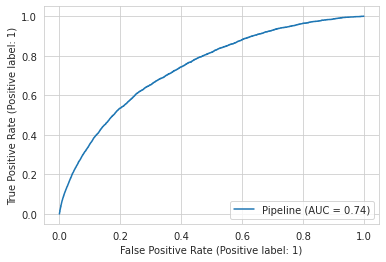

In [274]:
metrics.plot_roc_curve(clf_pipe, X_test, y_test)

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Confusion Matrix</h3>

Text(33.0, 0.5, 'Actual')

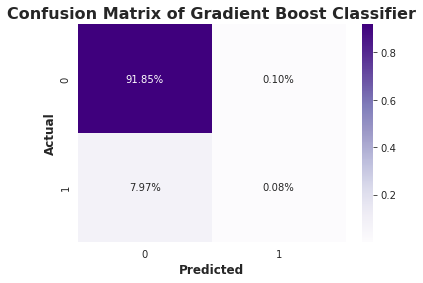

In [318]:
from sklearn.metrics import accuracy_score, recall_score, plot_roc_curve, confusion_matrix, classification_report, precision_recall_curve, auc

cf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='Purples')
plt.title('Confusion Matrix of Gradient Boost Classifier', fontweight='bold', fontsize=16)
plt.xlabel('Predicted', fontweight='bold', fontsize=12)
plt.ylabel('Actual', fontweight='bold', fontsize=12)

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Baseline Random Forest</h2>


Random Forest works in two-phase first is to create the random forest by combining N decision tree, and second is to make predictions for each tree created in the first phase.

The Working process can be explained in the below steps and diagram:

Step-1: Select random K data points from the training set.

Step-2: Build the decision trees associated with the selected data points (Subsets).

Step-3: Choose the number N for decision trees that you want to build.

Step-4: Repeat Step 1 & 2.

In [315]:
Image(url= "https://cdn.corporatefinanceinstitute.com/assets/random-forest.png", width=900, height=900)

In [316]:
Image(url= "https://miro.medium.com/max/1400/1*cBaV_bLVW-gT6PkG5ve26A.png", width=900, height=900)

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Fitting and Storing Results</h3>


ROC_AUC_Score 0.7253912369656725


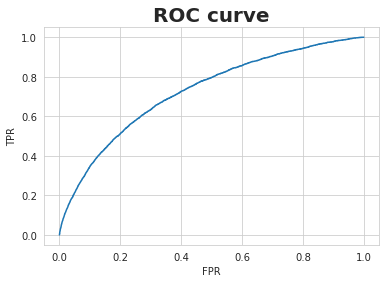

,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,Train Time(s),Test Time(s),Description
0,Baseline 1 LogReg,HCDR,91.92%,91.93%,91.93%,92.2735,2.1092,Baseline 1 LogReg pipeline with Cat+Num features
1,Baseline 1 RandomForest,HCDR,91.92%,91.95%,91.95%,42.8980,2.6084,Baseline 1 RandomForest pipeline with Cat+Num ...
2,Baseline 1 RandomForest,HCDR,91.92%,91.95%,91.95%,43.5266,2.5553,Baseline 1 RandomForest pipeline with Cat+Num ...
3,Baseline 1 LogReg,HCDR,91.92%,91.93%,91.93%,94.5804,2.4234,Baseline 1 LogReg pipeline with Cat+Num features
4,Baseline 1 RandomForest,HCDR,91.92%,91.95%,91.95%,43.8864,2.5624,Baseline 1 RandomForest pipeline with Cat+Num ...


In [275]:
# def model_rf(X_train):
    
RF = RandomForestClassifier(random_state = 42,n_estimators=20, criterion='gini', max_depth=6)

data_pipeline_rf = make_pipeline(data_pipeline, RF)
start = time()
data_pipeline_rf.fit(X_train, y_train)
train_time = np.round(time() - start, 4)
train_acc = data_pipeline_rf.score(X_train, y_train)
validAcc  = data_pipeline_rf.score(X_test, y_test)
start = time()
testAcc  = data_pipeline_rf.score(X_test, y_test)
test_time = np.round(time() - start, 4)

predictions = data_pipeline_rf.predict_proba(X_test)
print ("ROC_AUC_Score",roc_auc_score(y_test, predictions[:,1]))

fpr, tpr, _ = roc_curve(y_test, predictions[:,1])

plt.clf()
plt.plot(fpr, tpr)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve',fontweight='bold',fontsize=20)
plt.show()
try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc",
                                               "Train Time(s)",  "Test Time(s)", "Description",])
experimentLog.loc[len(experimentLog)] =[f"Baseline 1 RandomForest", "HCDR", 
                                        f"{trainAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", f"{testAcc*100:8.2f}%",
                                        train_time, test_time,
                                        "Baseline 1 RandomForest pipeline with Cat+Num features"]

experimentLog

In [276]:
y_pred_rf = data_pipeline_rf.predict(X_test)

In [277]:
res = data_pipeline_rf.predict_proba(X_train)
res

array([[0.94402268, 0.05597732],
       [0.88961809, 0.11038191],
       [0.93682042, 0.06317958],
       ...,
       [0.95657847, 0.04342153],
       [0.91790688, 0.08209312],
       [0.89067702, 0.10932298]])

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Validation Accuracy</h3>


In [278]:
print('Validation set accuracy score: ' + str(accuracy_score(y_test,y_pred_rf)))

Validation set accuracy score: 0.9195323805342829


<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Log Loss</h3>

In [280]:
log_loss(y_test,y_pred_rf)

2.7792531157571663

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> ROC-AUC Score</h3>

In [281]:
roc_auc_score(y_test, clf_pipe.predict_proba(X_test)[:, 1])

0.7417601109275497

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> ROC Curve</h3>


In [282]:
import matplotlib.pyplot as plt
from sklearn import metrics

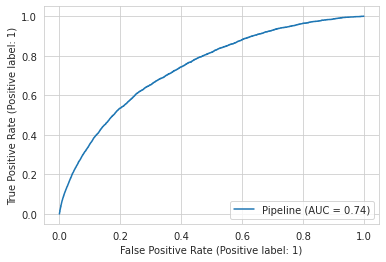

In [283]:
metrics.plot_roc_curve(clf_pipe, X_test, y_test)

In [142]:
X_train

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,...,EMERGENCYSTATE_MODE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR
123473,243191,Cash loans,F,Y,N,171000.0,555273.0,16366.5,Unaccompanied,Pensioner,...,NaN,0.0,0.0,1,0,0,0,0,0.0,1.0
10118,111778,Cash loans,M,N,Y,157500.0,198085.5,23638.5,Unaccompanied,Working,...,No,1.0,0.0,1,0,0,0,0,0.0,1.0
64716,175057,Cash loans,M,Y,Y,135000.0,776304.0,25173.0,Unaccompanied,Working,...,NaN,2.0,0.0,0,0,0,0,0,0.0,5.0
234940,372147,Cash loans,M,Y,Y,164133.0,900000.0,36787.5,Unaccompanied,Commercial associate,...,No,0.0,0.0,0,0,0,0,0,0.0,3.0
236051,373412,Cash loans,M,N,Y,225000.0,533668.5,21294.0,"Spouse, partner",Commercial associate,...,NaN,6.0,0.0,1,0,0,0,0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119879,239009,Cash loans,F,N,Y,121500.0,675000.0,32602.5,Unaccompanied,Working,...,NaN,0.0,0.0,1,0,0,0,0,NaN,NaN
259178,399937,Cash loans,F,N,N,225000.0,509922.0,40419.0,"Spouse, partner",Commercial associate,...,NaN,5.0,0.0,1,0,0,0,0,0.0,4.0
131932,253016,Cash loans,M,Y,Y,450000.0,1125000.0,33025.5,Unaccompanied,Working,...,No,0.0,0.0,0,0,0,0,0,2.0,3.0
146867,270275,Revolving loans,M,Y,Y,180000.0,270000.0,13500.0,Unaccompanied,Working,...,No,0.0,0.0,0,0,0,0,0,0.0,1.0


<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Confusion Matrix</h3>

Text(33.0, 0.5, 'Actual')

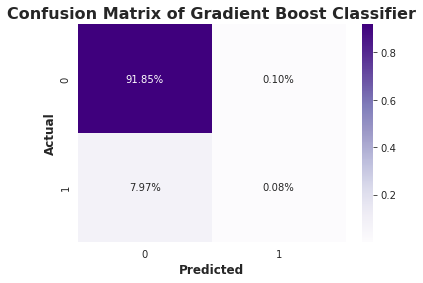

In [317]:
from sklearn.metrics import accuracy_score, recall_score, plot_roc_curve, confusion_matrix, classification_report, precision_recall_curve, auc

cf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='Purples')
plt.title('Confusion Matrix of Gradient Boost Classifier', fontweight='bold', fontsize=16)
plt.xlabel('Predicted', fontweight='bold', fontsize=12)
plt.ylabel('Actual', fontweight='bold', fontsize=12)

<h1 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Preparing Test Data</h1>


In [289]:
datasets['application_test'] = datasets['application_test'].drop(['REG_REGION_NOT_WORK_REGION','REG_REGION_NOT_LIVE_REGION',  
'FLAG_DOCUMENT_2',               
'FLAG_DOCUMENT_21',               
'AMT_REQ_CREDIT_BUREAU_DAY',      
'FLAG_EMAIL',                    
'AMT_REQ_CREDIT_BUREAU_QRT',                    
'FLAG_DOCUMENT_4',              
'FLAG_DOCUMENT_17',             
'FLAG_DOCUMENT_11',              
'FLAG_DOCUMENT_9',              
'FLAG_DOCUMENT_15',            
'FLAG_DOCUMENT_18',             
'FLAG_DOCUMENT_8','TOTALAREA_MODE','ELEVATORS_AVG','LIVINGAPARTMENTS_AVG',
                                                                    'LIVINGAREA_AVG','APARTMENTS_MODE','ELEVATORS_MODE',
                                                                    'LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE'
                                             ,'APARTMENTS_MEDI','ELEVATORS_MEDI','LIVINGAPARTMENTS_MEDI','LIVINGAREA_MEDI',
'NONLIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI','FLOORSMIN_MEDI',
                                                                    'FLOORSMAX_MEDI','ENTRANCES_MEDI','FLOORSMAX_MODE','FLOORSMIN_MODE','BASEMENTAREA_MEDI',
                                                                    'BASEMENTAREA_MODE','YEARS_BUILD_MEDI','NONLIVINGAPARTMENTS_MODE','NONLIVINGAREA_MODE','YEARS_BUILD_MEDI',
                                            'YEARS_BUILD_MODE','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BEGINEXPLUATATION_MODE','COMMONAREA_MEDI','COMMONAREA_MODE',
                                                                    'ENTRANCES_MODE','LANDAREA_MODE','LANDAREA_MEDI','DEF_30_CNT_SOCIAL_CIRCLE','OBS_30_CNT_SOCIAL_CIRCLE',
                                                                    'REG_CITY_NOT_LIVE_CITY','REGION_RATING_CLIENT',
                                                                   'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'FLOORSMIN_AVG','DAYS_LAST_PHONE_CHANGE',
                                                                       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG',
                                                                    'LIVE_CITY_NOT_WORK_CITY','LIVE_REGION_NOT_WORK_REGION','AMT_GOODS_PRICE',
                                                                   'CNT_CHILDREN',
'AMT_REQ_CREDIT_BUREAU_HOUR',
'AMT_REQ_CREDIT_BUREAU_WEEK', 
'FLAG_MOBIL',                    
'FLAG_CONT_MOBILE',              
'FLAG_DOCUMENT_20',              
'FLAG_DOCUMENT_5',               
'FLAG_DOCUMENT_12',              
'FLAG_DOCUMENT_19',
'FLAG_DOCUMENT_10',
'FLAG_DOCUMENT_7'],axis=1)

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Missing Value Percent in Test Data</h2>


In [87]:
percent = (datasets["application_test"].isnull().sum()/datasets["application_test"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_test"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

,Percent,Test Missing Count
FONDKAPREMONT_MODE,67.28,32797
OWN_CAR_AGE,66.29,32312
LANDAREA_AVG,57.96,28254
BASEMENTAREA_AVG,56.71,27641
WALLSMATERIAL_MODE,49.02,23893
APARTMENTS_AVG,49.01,23887
HOUSETYPE_MODE,48.46,23619
ENTRANCES_AVG,48.37,23579
FLOORSMAX_AVG,47.84,23321
YEARS_BEGINEXPLUATATION_AVG,46.89,22856


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Test Data Exploration</h2>


In [290]:
datasets['application_test'].shape

(48744, 51)

In [291]:
datasets['application_test'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Data columns (total 51 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   SK_ID_CURR                   48744 non-null  int64  
 1   NAME_CONTRACT_TYPE           48744 non-null  object 
 2   CODE_GENDER                  48744 non-null  object 
 3   FLAG_OWN_CAR                 48744 non-null  object 
 4   FLAG_OWN_REALTY              48744 non-null  object 
 5   AMT_INCOME_TOTAL             48744 non-null  float64
 6   AMT_CREDIT                   48744 non-null  float64
 7   AMT_ANNUITY                  48720 non-null  float64
 8   NAME_TYPE_SUITE              47833 non-null  object 
 9   NAME_INCOME_TYPE             48744 non-null  object 
 10  NAME_EDUCATION_TYPE          48744 non-null  object 
 11  NAME_FAMILY_STATUS           48744 non-null  object 
 12  NAME_HOUSING_TYPE            48744 non-null  object 
 13  REGION_POPULATIO

In [292]:
datasets['application_test'].describe()

,SK_ID_CURR,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,...,LANDAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,4.874400e+04,4.874400e+04,48720.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,16432.000000,...,20490.000000,48715.000000,48715.000000,48744.000000,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000
mean,277796.676350,1.784318e+05,5.167404e+05,29426.240209,0.021226,-16068.084605,67485.366322,-4967.652716,-3051.712949,11.786027,...,0.067192,1.435738,0.101139,0.786620,0.087477,0.0,0.0,0.0,0.009299,1.983769
std,103169.547296,1.015226e+05,3.653970e+05,16016.368315,0.014428,4325.900393,144348.507136,3552.612035,1569.276709,11.462889,...,0.081909,3.580125,0.403791,0.409698,0.282536,0.0,0.0,0.0,0.110924,1.838873
min,100001.000000,2.694150e+04,4.500000e+04,2295.000000,0.000253,-25195.000000,-17463.000000,-23722.000000,-6348.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000
25%,188557.750000,1.125000e+05,2.606400e+05,17973.000000,0.010006,-19637.000000,-2910.000000,-7459.250000,-4448.000000,4.000000,...,0.019000,0.000000,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000
50%,277549.000000,1.575000e+05,4.500000e+05,26199.000000,0.018850,-15785.000000,-1293.000000,-4490.000000,-3234.000000,9.000000,...,0.048300,0.000000,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.000000,2.000000
75%,367555.500000,2.250000e+05,6.750000e+05,37390.500000,0.028663,-12496.000000,-296.000000,-1901.000000,-1706.000000,15.000000,...,0.086800,2.000000,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.000000,3.000000
max,456250.000000,4.410000e+06,2.245500e+06,180576.000000,0.072508,-7338.000000,365243.000000,0.000000,0.000000,74.000000,...,1.000000,351.000000,24.000000,1.000000,1.000000,0.0,0.0,0.0,6.000000,17.000000


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Datasets Questions </h2>

In [294]:
datasets.keys()

dict_keys(['application_train', 'application_test', 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 'previous_application', 'POS_CASH_balance'])

In [295]:
datasets["application_train"].head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,...,EMERGENCYSTATE_MODE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,202500.0,406597.5,24700.5,Unaccompanied,...,No,2.0,2.0,1,0,0,0,0,0.0,1.0
1,100003,0,Cash loans,F,N,N,270000.0,1293502.5,35698.5,Family,...,No,1.0,0.0,1,0,0,0,0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,67500.0,135000.0,6750.0,Unaccompanied,...,NaN,0.0,0.0,0,0,0,0,0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,135000.0,312682.5,29686.5,Unaccompanied,...,NaN,2.0,0.0,1,0,0,0,0,NaN,NaN
4,100007,0,Cash loans,M,N,Y,121500.0,513000.0,21865.5,Unaccompanied,...,NaN,0.0,0.0,0,0,0,0,0,0.0,0.0


In [296]:
len(datasets["application_train"]["SK_ID_CURR"].unique()) == datasets["application_train"].shape[0]

True

In [297]:
np.intersect1d(datasets["application_train"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])

array([], dtype=int64)

In [298]:
datasets["application_test"].shape

(48744, 51)

In [299]:
datasets["application_train"].shape

(307511, 52)

<h1 style = "font-family: Times New Roman;background-color:#CbC3E3  ">Kaggle Submission </h1>

In [302]:
pred= clf_pipe.predict(datasets["application_test"])
pred_df = pd.DataFrame(pred)
pred_df.shape

(48744, 1)

In [303]:
pred_df.value_counts()

0    48649
1       95
dtype: int64

In [304]:
pred_proba = clf_pipe.predict_proba(datasets["application_test"])
pred_proba_df = pd.DataFrame(pred_proba)

In [305]:
pred_proba_df

,0,1
0,0.939066,0.060934
1,0.766156,0.233844
2,0.947208,0.052792
3,0.950071,0.049929
4,0.857568,0.142432
...,...,...
48739,0.970325,0.029675
48740,0.946596,0.053404
48741,0.941403,0.058597
48742,0.928029,0.071971


In [306]:
class_1_proba = pred_proba_df[[1]]

In [307]:
datasets['application_test'].head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,...,EMERGENCYSTATE_MODE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,135000.0,568800.0,20560.5,Unaccompanied,Working,...,No,0.0,0.0,1,0,0,0,0,0.0,0.0
1,100005,Cash loans,M,N,Y,99000.0,222768.0,17370.0,Unaccompanied,Working,...,NaN,0.0,0.0,1,0,0,0,0,0.0,3.0
2,100013,Cash loans,M,Y,Y,202500.0,663264.0,69777.0,NaN,Working,...,NaN,0.0,0.0,0,0,0,0,0,0.0,4.0
3,100028,Cash loans,F,N,Y,315000.0,1575000.0,49018.5,Unaccompanied,Working,...,No,0.0,0.0,1,0,0,0,0,0.0,3.0
4,100038,Cash loans,M,Y,N,180000.0,625500.0,32067.0,Unaccompanied,Working,...,NaN,0.0,0.0,1,0,0,0,0,NaN,NaN


In [308]:
final = pd.DataFrame()

In [309]:
final['SK_ID_CURR'] = datasets['application_test']['SK_ID_CURR']
final['TARGET'] = class_1_proba[1]

In [310]:
final

,SK_ID_CURR,TARGET
0,100001,0.060934
1,100005,0.233844
2,100013,0.052792
3,100028,0.049929
4,100038,0.142432
...,...,...
48739,456221,0.029675
48740,456222,0.053404
48741,456223,0.058597
48742,456224,0.071971


In [311]:
final = final.set_index('SK_ID_CURR')

In [312]:
final.to_csv('submission.csv')

# Kaggle submission via the command line API

In [313]:
! kaggle competitions submit -c home-credit-default-risk -f submission.csv -m "baseline submission"

100%|███████████████████████████████████████| 1.26M/1.26M [00:02<00:00, 648kB/s]
Successfully submitted to Home Credit Default Risk

## report submission

Click on this [link](https://www.kaggle.com/c/home-credit-default-risk/submissions?sortBy=date&group=all&page=1)

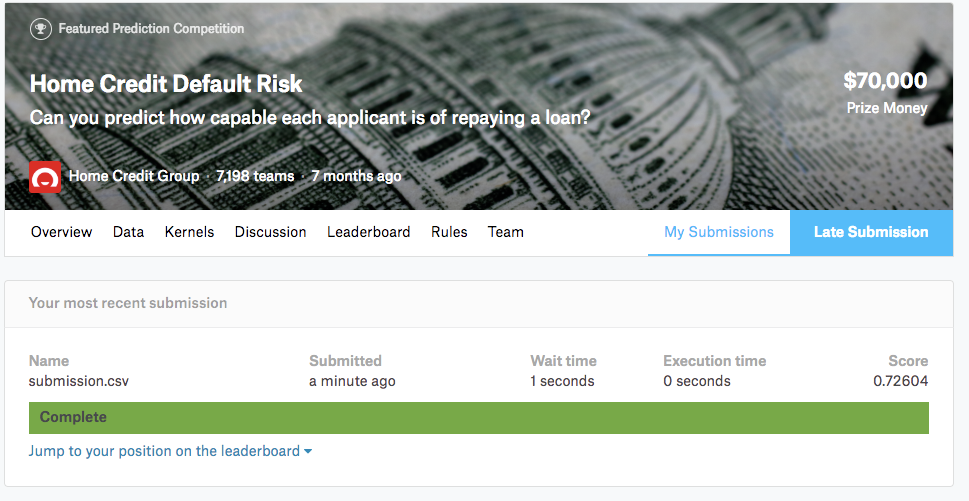

<h1 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Write Up </h1>


## Phase 1 - Final Project HCDR/CaDoD - EDA + Baseline

# Home Credit Default Risk Kaggle Competition


## PROJECT MEMBERS:


ADITI MULYE - adimulye@iu.edu

KESHAV LIKHAR - klikhar@iu.edu

NIKUNJ MALPANI - nmalpani@iu.edu

PRASHASTI KARLEKAR - prkarl@iu.edu






































## PROJECT ABSTRACT

The course project is based on the Home Credit Default Risk (HCDR) (https://www.kaggle.com/c/home-credit-default-risk/). The objective of Home Credit Default Risk project is to correctly offer loans to individuals who can pay back and turn away those who cannot. In other words, the goal is to predict whether or not a client will repay a loan.
In this phase of the project, we will perform analysis and modelling of the Home Credit default risk data currently hosted on Kaggle. The objective of this phase of the project is to perform exploratory data analysis on the data, which includes describing the data, calculating the summary statistics on the data to summarize its main characteristics, visualizing the results, finding missing items count for all the input variables , etc. This step tells us what the data can tell us before we start modeling the data and to perform initial investigations on data so as to discover patterns, to spot irregularities and biases, and to check assumptions with help of summary statistics. The EDA process also involved dropping the columns with the most missing value counts. Subsequently, we built correlation matrix to find and remove highly correlated variables which would render our model inefficient. To avoid any inaccuracy, we  Split the dataframe into train and test subsets. Next, we create pipelines to separately impute numerical and categorical values.We use one-hot encoding to transform the categorical variable values. Finally, we have used Logistic Regression and Random Forest to predict our target variable according to our input variables. 






## PROJECT DESCRIPTION
1. Data description
The home-credit data is currently available on Kaggle for predicting whether or not a client will repay a loan or have difficulty, which is a critical business need. In this dataset we have a total of 122 columns. There are a lot of columns which have missing values in the dataset. As we can already see that there are so many missing values in the top 10 rows itself.
We'll have to figure out a way to deal with this!
There are 7 different sources of data:
* application_train/application_test: the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating 0: the loan was repaid or 1: the loan was not repaid.
* bureau: data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* bureau_balance: monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
previous_application: previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* POS_CASH_BALANCE: monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* installments_payment: payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.
This diagram shows how all of the data is related:





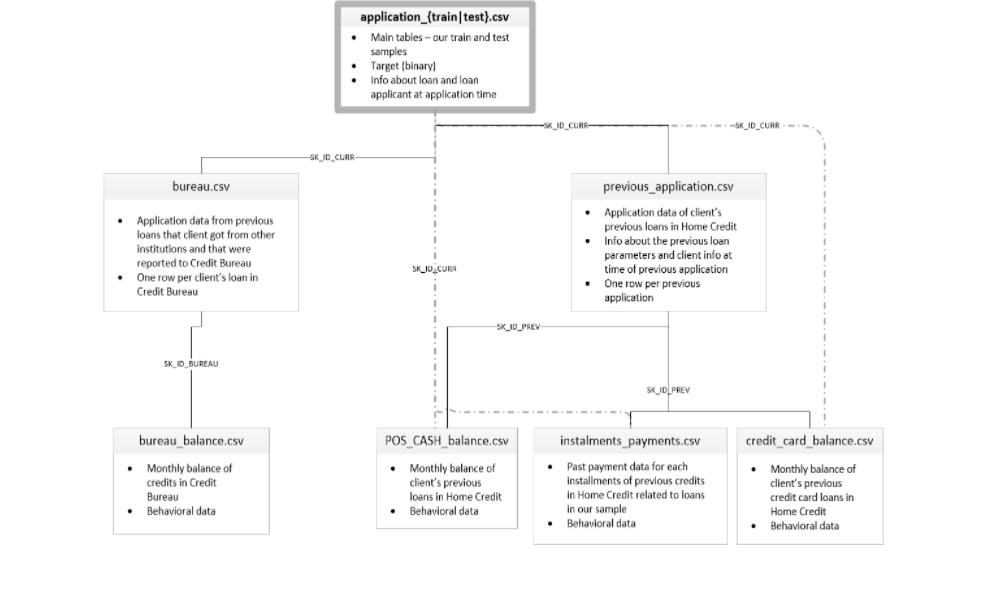


## Task to be tackled 
The task at hand for this phase of the project is to 
* Explore the data
* Figure out and  mitigate possible errors in the data that could render our model inaccurate
* Find missing values and highly correlated features 
* Standardize the data 
* Impute the data
* Split the data into training and test subsets
* Handling the categorical and numerical variables separately
* Build baseline models using Logistic Regression and Random Forest
* Calculate and validate the results

Provide diagrams to aid understanding the workflow











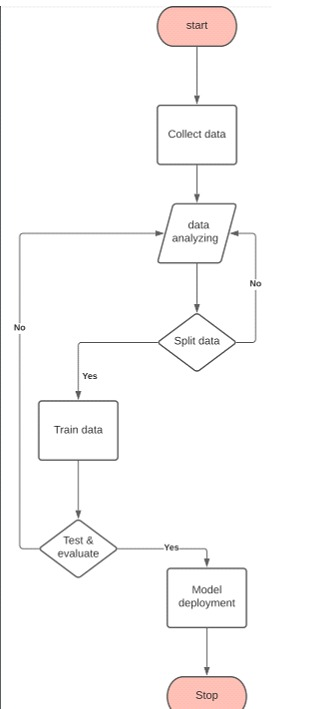


## EXPLORATORY DATA ANALYSIS
Before deriving insights from the data, we need to know the data which gives a better idea of the problem at hand and the irregularities in the data are exposed with further analysis which need to be corrected before building the model. Here, we look at application_train.csv dataset.

Steps performed in this phase of project:
* Read and examine the dataset - 
* In this step, firstly we import all the packages and modules. We import our data and load it in a dataframe. 
* Determine the shape of the data-  It is important to know the dimensionality of the dataset before processing the data. We use shape property of the dataframe to determine the number of columns and rows of our dataset. 
datasets['application_train'].shape








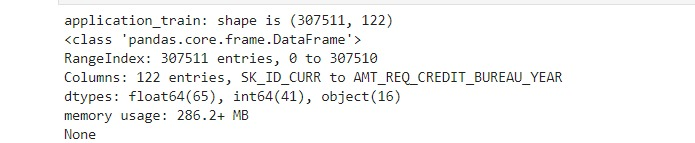


 Identify the types of data available - 
Before proceeding for the further analysis of the data, we determine the datatypes of our variables. This uncovers several issues that can be encountered later, for example not converting the datatypes of the variables which seem to be correct but essentially need to be represented as another datatype.
datasets['application_train'].info(verbose=True) 
info() prints information about a DataFrame including the index dtype and columns, non-null values and memory usage.


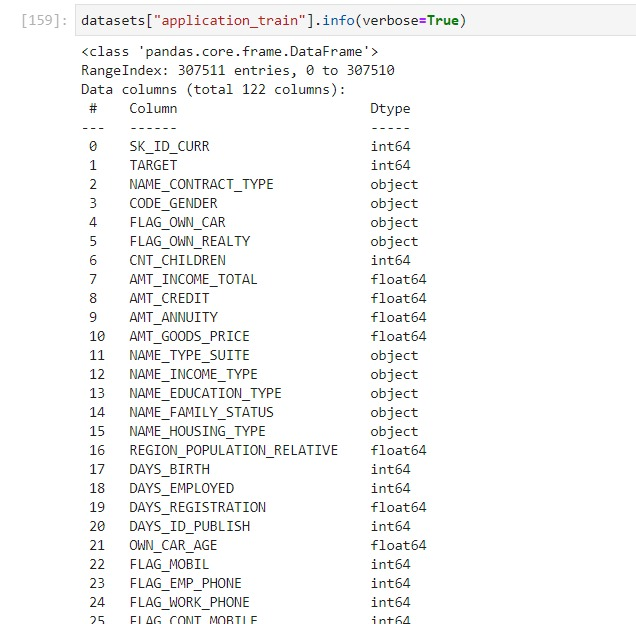

 Evaluate basic statistical information about the data 
To get an idea of the average value of the data in the data set, we measure the central tendencies of our dataset.
datasets["application_train"].describe(include='all') 
describe() prints descriptive statistics that summarize the central tendency, dispersion and shape of a dataset’s distribution.


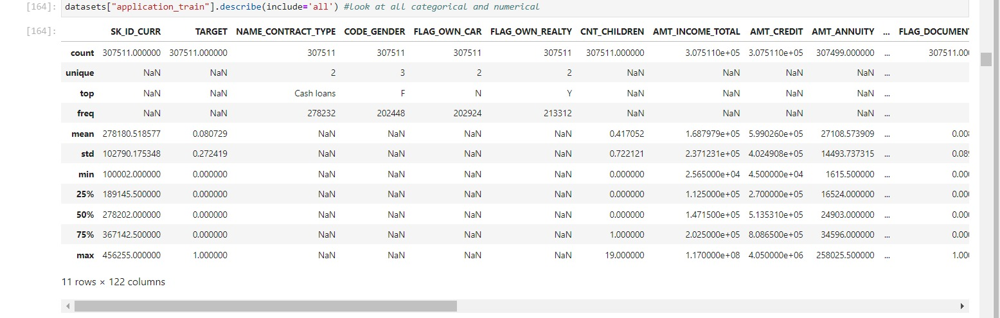

Finding number of numerical variables and categorical variables
It is important to deal with numerical and categorical variables differently. Categorical features have a lot to say about the dataset thus they should be converted to numerical to make it into a machine-readable format.


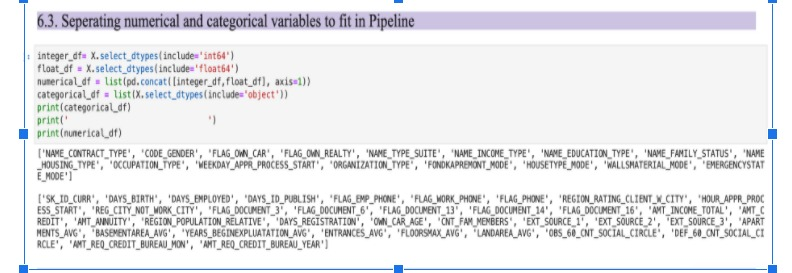

 Check and determine missing data  
Before we can use data with missing data fields, we need to transform these fields to be used for analysis and modelling. It is very important to handle missing data either by deleting or through imputation (handling the missing values with some estimation).


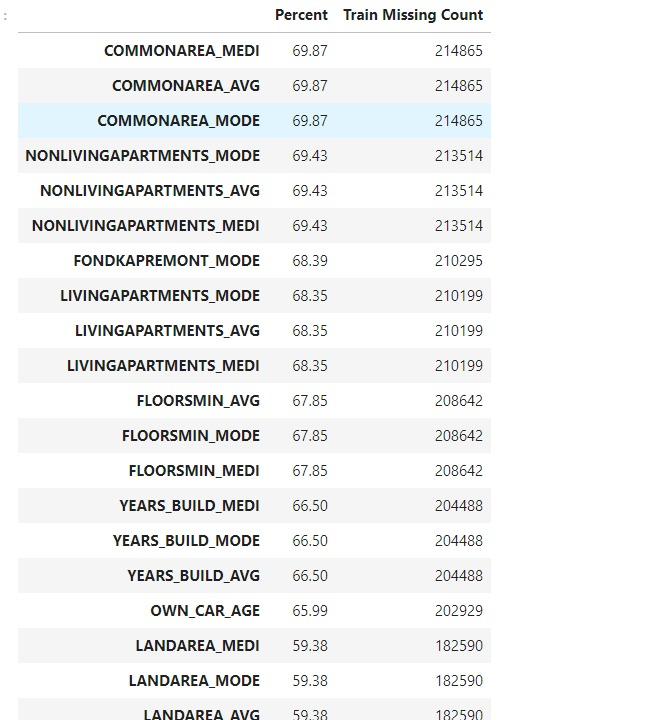

We determine the number of missing data in every column and sort the values in descending order according to the missing count to determine which features have the most missing values. We transform our dataframe to include only the columns which have more than 50 percent non-missing values.
Next up, we impute the remaining missing data with median for numerical variables and the most frequent variable for the categorical variables.


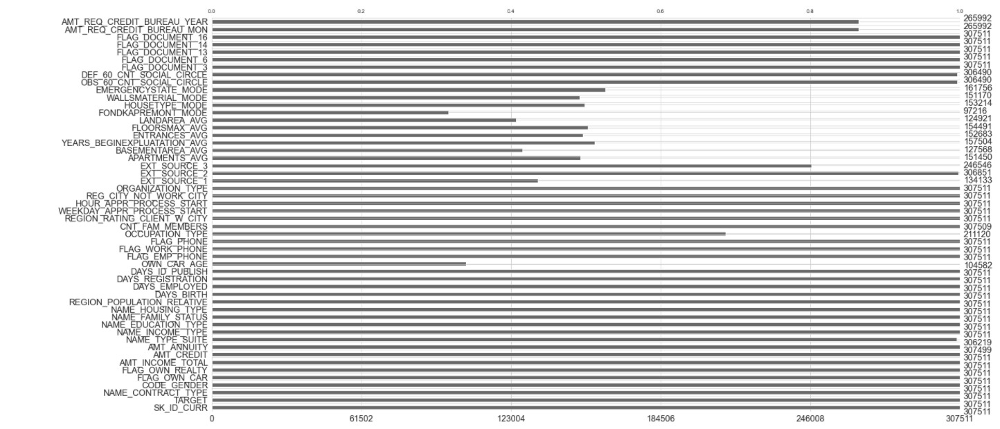

 Visualization through correlation matrix   
A Correlation Matrix is used to examine the relationship between multiple variables at the same time. When we do this calculation we get a table containing the correlation coefficients between each variable and the others. Now, the coefficient show us both the strength of the relationship and its direction (positive or negative correlations). In Python, a correlation matrix can be created using the Python packages Pandas and NumPy, for instance.
If we have a big data set, and we have an intention to explore patterns.
For use in other statistical methods. For instance, correlation matrices can be used as data when conducting exploratory factor analysis, confirmatory factor analysis, structural equation models.
Correlation matrices can also be used as a diagnostic when checking assumptions for e.g. regression analysis.


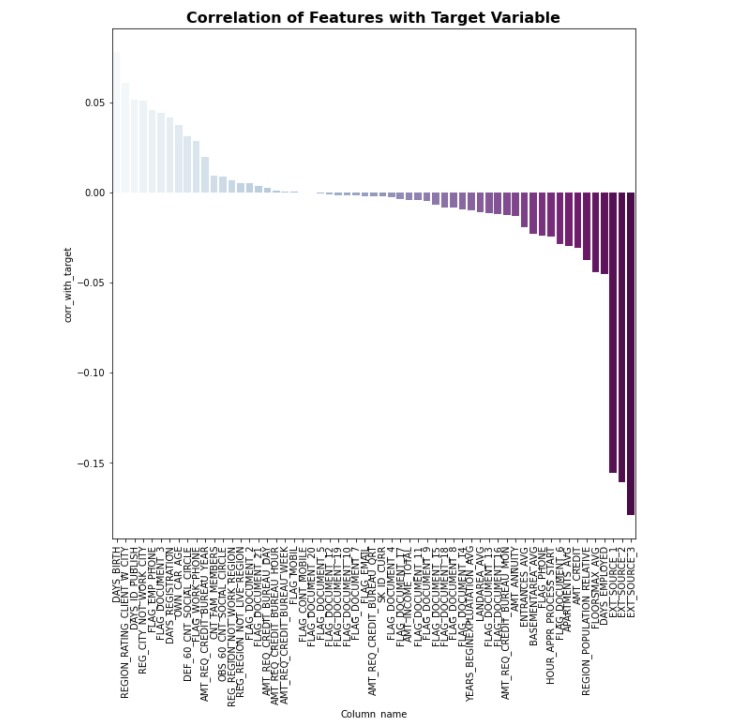

Above, we have plotted the graph of correlation of all the features with the target variable. As it can be seen above, there are approximately 30% features which are not at all correlated with the target variable. We can drop them as we do not believe that they will influence our predictions of the target variable!
Next, we drop the irrelevant variables which are highly correlated with one another. 


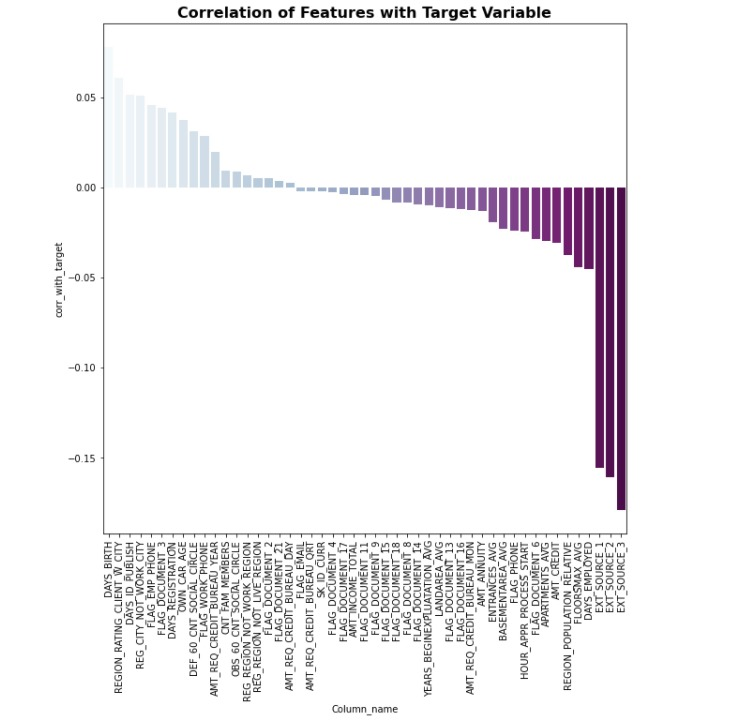

Conclusions of the Correlation Matrix 
After we see that there are many independent or feature variable which are related to each other, we will deal with them in a way that we drop the repetitive features, i.e. delete one of those columns which are highly correlated with each other! Thus, as we can see above, I have removed all those columns that ae related to each other, just leaving out one!



VISUAL EXPLORATORY DATA ANALYSIS

1. In this phase, we derive meaningful insights from the data by answering reasonable questions that we found that need to be answered from the earlier steps.
How is the distribution of target labels? - Did most people return on time ?
According to the description of the data -"1 indicates client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 indicates all other cases".


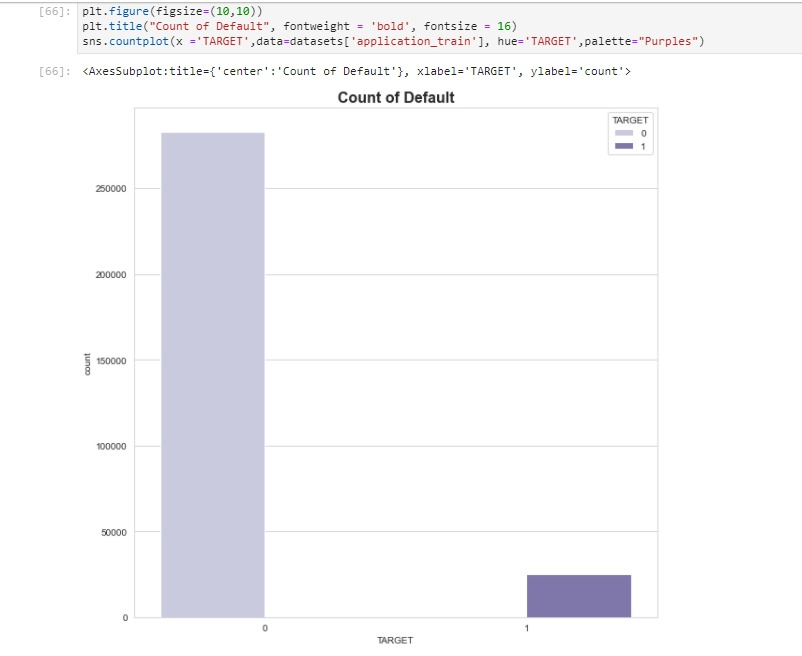

2. How is the distribution of  Applicant’s Family Members Count?


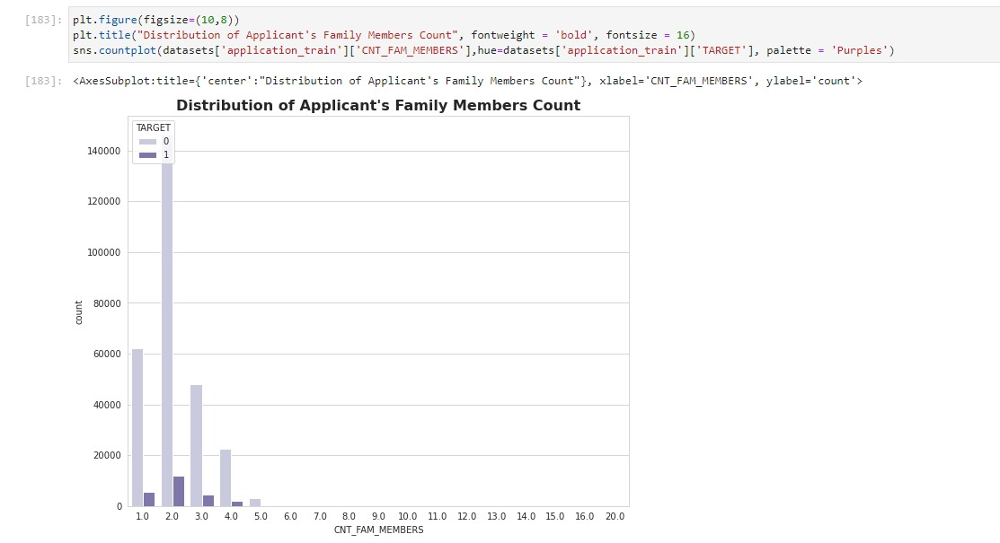

Above, we have plotted a graph which describes the loan applicant's family members.
As we can see above, there are hardly any people who have a count of family members greater than 5.

Who is the highest borrower ?  


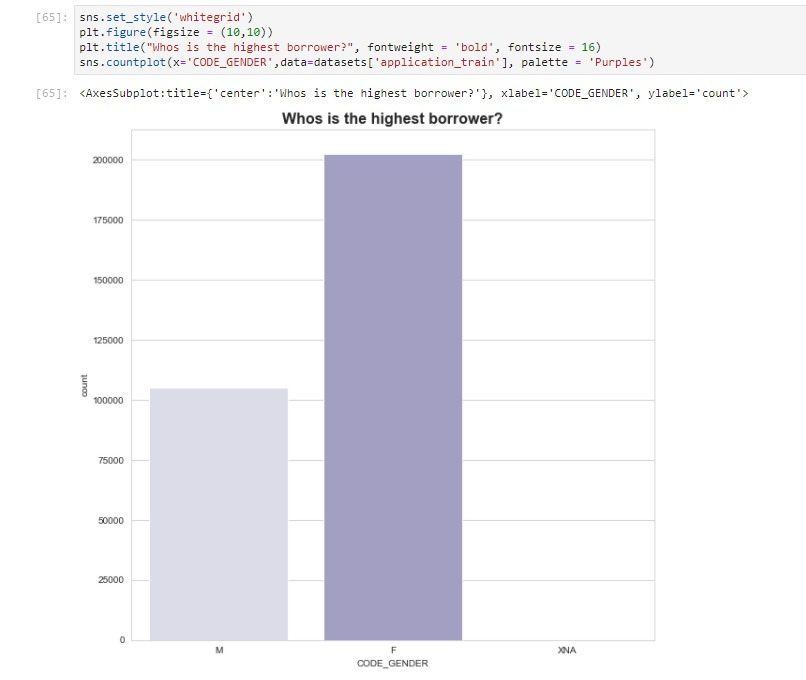

As we can see Females are the highest borrowers.


## PAIR BASED VISUALIZATION

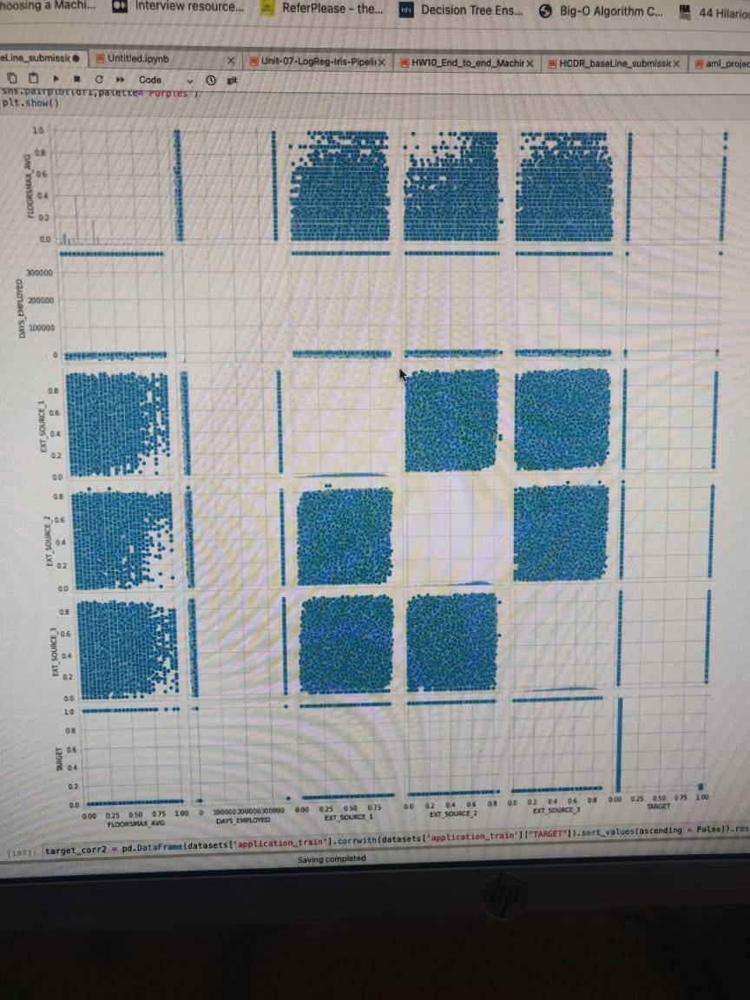

Pairplot showing correlation with target variable for highly correlated variable with target.

## MODELING PIPELINES
In this section of the project, the following steps have been performed:
Standardizing the data - The numerical variables have been standardized.
Handling missing values - 
Following the good practice of imputing the missing values in the dataset, we impute the numerical as well as categorical variables as follows. All the work has been performed in pipelines. The numerical variables have been imputed with the median and the categorical variables have been imputed with the most frequent variable.


Handling categorical variables
We have used one of the most common and efficient way to handle this transformation, ONE-HOT ENCODING. After the transformation, each column of the resulting data set corresponds to one unique value of each original feature. We want to implement the one-hot encoding to the data set, in such a way that the resulting sets are suitable to use in machine learning algorithms.


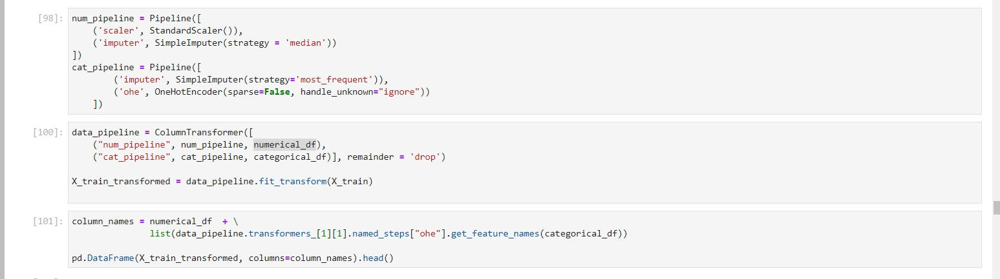

Model training : Now that we have explored the data, cleaned it, preprocessed it and added a new feature to it, we can start the modeling part of the project by applying Machine Learning algorithms. In this section, wel have a baseline logistic regression model and a random forest model. In the end, we will be comparing the performance of the models with the baseline models.

Baseline Logistic Regression


Logistic Regression is a powerful algorithm for classification problems that fit models for categorical data, especially for binary classification problems. Since our target (dependent) variable is categorical, using logistic regression can directly predict the probability that a customer is creditworthy (able to meet a financial obligation in a timely manner) or not, using a number of predictors.


Loss function used (data loss and regularization parts) in latex - 


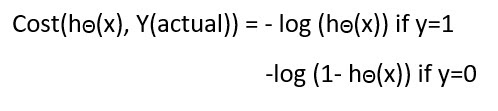

Accuracy and AUC/ROC -
Accuracy: Accuracy represents the number of correctly classified data instances over the
total number of data instances.
Below is the accuracy and the AUC/RUC of our logistic regression model.


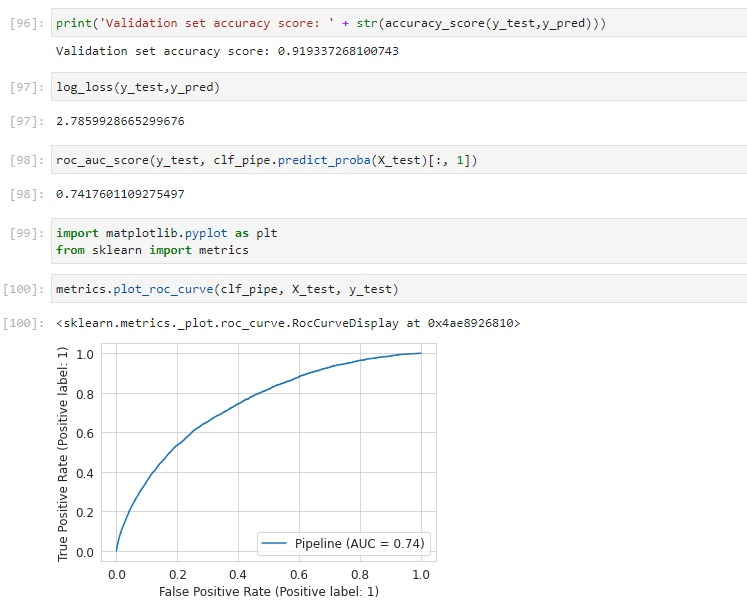

Baseline Random Forest 

Random Forest is one of the most popular algorithms which assembles a large number of decision trees from the training dataset. Each decision tree represents a class prediction. This method collects the votes from these decision trees and the class with the most votes is considered as the final class. Random forest outperforms linear models because it can catch non-linear relationships between the object and the features.


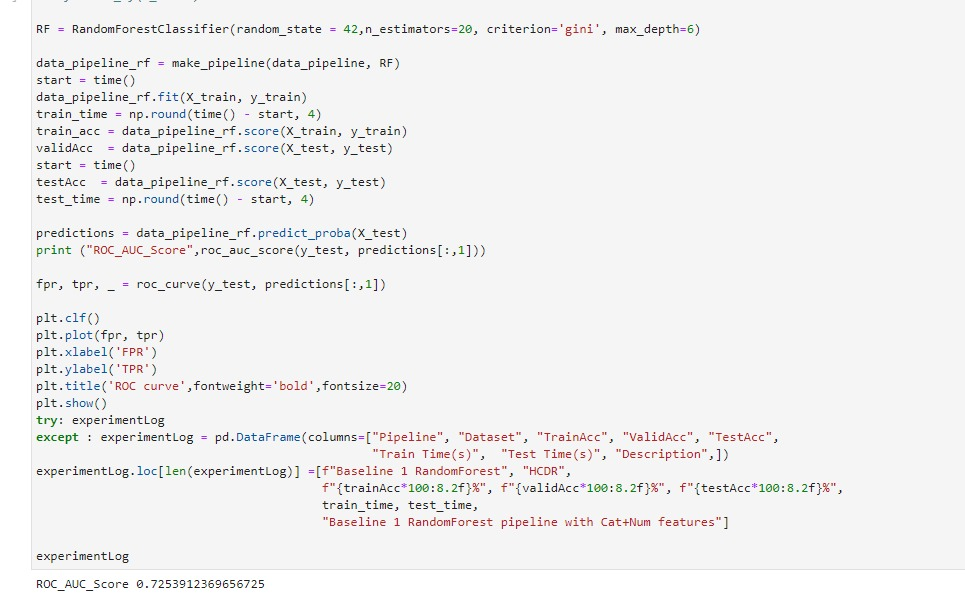

Loss function used (data loss and regularization parts) in latex - 


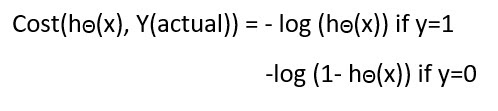

Accuracy and AUC/ROC -
Accuracy: Accuracy represents the number of correctly classified data instances over the
total number of data instances.
ROC / AUC: An ROC curve (receiver operating characteristic curve) is a graph showing the performance of a classification model at all classification thresholds. This curve plots two parameters:
True Positive Rate
False Positive Rate
AUC provides an aggregate measure of performance across all possible classification thresholds.
One way of interpreting AUC is as the probability that the model ranks a random positive
example more highly than a random negative example.

Below is the accuracy and the AUC/RUC of our random forest model.


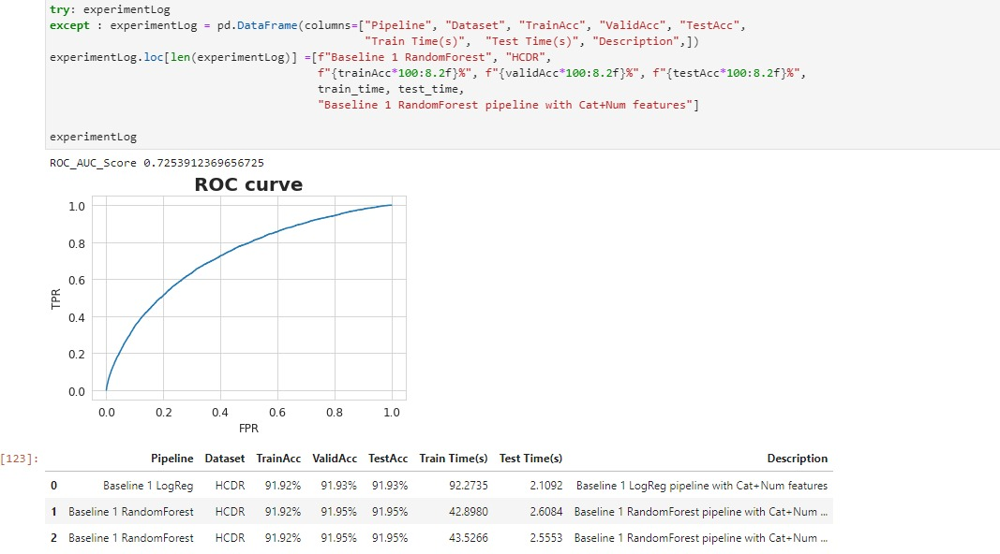

Number of experiments conducted
We have selected 2 models for prediction : Logistic Regression and Random Forest Classifier


## Discussion of Results


# Kaggle Submission
Please provide a screenshot of your best kaggle submission.   
The screenshot should show the different details of the submission and not just the score.

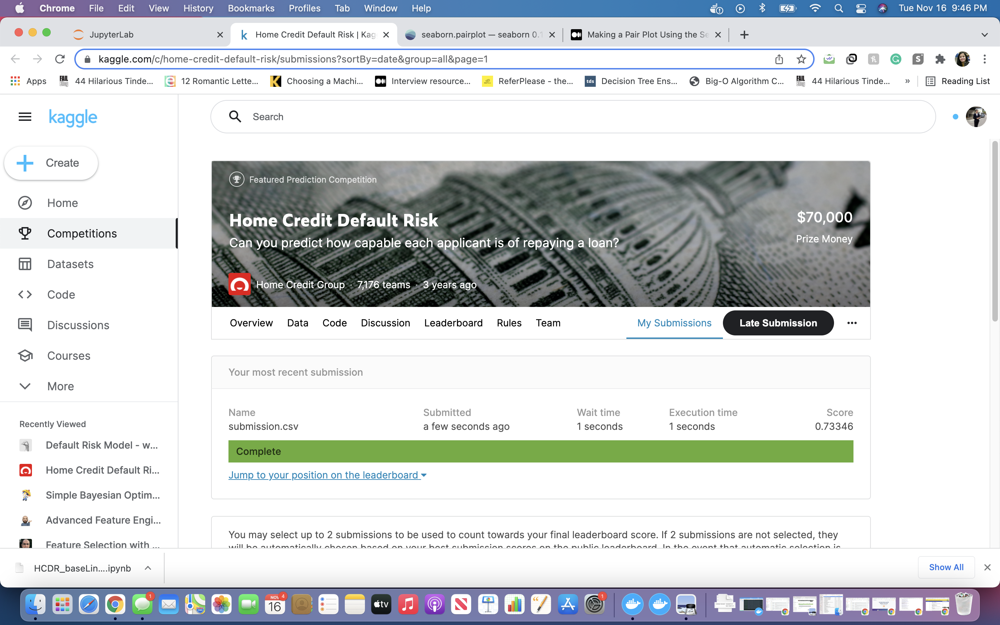

# References

https://github.iu.edu/jshanah/I526_AML_Student/tree/master/Labs/Labs-09-Pipelines-Column_Transformer_2020_10

https://github.iu.edu/jshanah/I526_AML_Student/tree/master/Labs/Labs-10.1-Decision-Trees

https://machinelearningmastery.com/random-forest-ensemble-in-python/

https://blog.citizennet.com/blog/2012/11/10/random-forests-ensembles-and-performance-metrics

https://builtin.com/data-science/random-forest-algorithm

https://towardsdatascience.com/logistic-regression-detailed-overview-46c4da4303bc

https://github.com/rakshithvasudev/Home-Credit-Default-Risk